In [101]:
import sys
import os

sys.path.append(r'C:\Program Files\QGIS 3.22.3\apps\qgis\python') #this is important for loading qgis library
sys.path.append(r'C:\Program Files\QGIS 3.22.3\apps\qgis\python\plugins') #this is important for loading processing library

In [102]:
import qgis
from qgis.gui import *
from qgis.core import *
from qgis.utils import plugins
from PyQt5.QtCore import *
from qgis.analysis import QgsNativeAlgorithms

In [593]:
import pandas as pd
import numpy as np
import seaborn as sns
import geopandas as gpd
from shapely.geometry import box
import matplotlib.pyplot as plt
%matplotlib inline

# Day 1 - Part II - Introduction to Core Packages <img src="./Resources/sla.png" width="100" align ="right"/>

We use Python to **handle data**, possibly lots of data, spatial and non-spatial. The data comes in lots of formats, and we will spend a lot time on wrangling the data and geocoding the data to get it into a usable form.

Pandas is the primary tool in the Python ecosystem for handling data. Its primary object, the `DataFrame` is extremely useful in wrangling data. We will explore some of that functionality first. Next, we will learn Geopandas, which is the defacto geospatial library in Python. It offers so many functionalities and integrates well with the Python Data Science ecosystem libraries. 

## Pandas 

We will explore what we can do with Pandas using two real datasets (CSV):
1) Singapore Central Region schools latlong: [Data/CentralRegion_schools_latlong.csv](Data/CentralRegion_schools_latlong.csv)
2) Singapore Central Region schools postal code: [Data/CentralRegion_schools_postcode.csv](Data/CentralRegion_schools_latlong.csv) 

In the real work, the data we have are usualy in the format of excel or csv files. We have clean the data and join the tables. Pandas is extremely useful in these types of data wrangling. 

### Pandas DataFrame Object

Pandas provides an efficient implementation of a `DataFrame`. DataFrames are essentially multidimensional arrays with attached row and column labels. Different columns are often with heterogeneous types. The dataset often has missing data.

In [23]:
schools_latlong = pd.read_csv("Data/CentralRegion_schools_latlong.csv")
schools_latlong.head()

,BUILDING_N,longitude,latitude
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,103.834958,1.319923
1,AI TONG SCHOOL,103.833020,1.360583
2,ALEXANDRA PRIMARY SCHOOL,103.824425,1.291334
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),103.835941,1.319662
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,103.781310,1.301061


In [24]:
schools_postcode = pd.read_csv("Data/CentralRegion_schools_postcode.csv")
schools_postcode.head()

,BUILDING_N,HOUSE_BLK_NO,ROAD_NAME,POSTAL_CODE
0,CANTONMENT PRIMARY SCHOOL,1,CANTONMENT CLOSE,88256
1,RADIN MAS PRIMARY SCHOOL,1,BUKIT PURMEI AVENUE,99840
2,BLANGAH RISE PRIMARY SCHOOL,91,TELOK BLANGAH HEIGHTS,109100
3,ISS INTERNATIONAL SCHOOL (PRESTON CAMPUS),21,PRESTON ROAD,109355
4,LORNA WHISTON PRE-SCHOOL,9,WINCHESTER ROAD,117783


Let's say our tasks are to:
1. Edit the tables such as change column names, and maybe join the tables by building name (i.e., BUILDING_N).
2. Geocode all school buildings and geovisualize these points in QGIS.
3. Generate a heatmap to show the density of school buildings.
4. Calculate basic statistics of the these school buildings such as the number of buildings within each subzone.
5. Spatial join the number of school buildings into a polygon layer such as subzone.
6. Generate a chorepleth map of the polygon layer using a field such as the number of school buildings.
7. Calculate the distances from another point layer such as warehouses to the school building layer.
8. Site selection: select how many warehouses and where to build them to meet all demands of schools and meanwhile minimize the cost.
9. Route planning: plan the shortest possible route that visits each school exactly once and returns to the origin warehouse (i.e., traveling salesman problem).
10. Automate the process. If we get new data, we can change the configuration and simply re-run the program.

### Dataframe Indexing and Selection

We can also think of a DataFrame as a specialization of a dictionary. Where a dictionary maps a key to a value, a DataFrame maps a column name to a Series of column data. 

In [60]:
# Let's try to get the first row
schools_latlong[0] # oops error

Notice the difference here:
* In a two-dimesnional NumPy array, data[0] will return the first **row**. 
* For a DataFrame, data['col0'] will return the first **column**. 

Because of this, it is probably better to think about DataFrames as generalized dictionaries rather than generalized arrays, though both ways of looking at the situation can be useful.

In [58]:
schools_latlong['longitude'] # it is the same with schools_latlong.longitude

0      103.834958
1      103.833020
2      103.824425
3      103.835941
4      103.781310
          ...    
133    103.900128
134    103.897225
135    103.911553
136    103.842552
137    103.825952
Name: longitude, Length: 138, dtype: float64

In [91]:
# to get the first value of the column longitude
schools_latlong['longitude'][0]

103.834958

In [ ]:
# but this is not the preferred way to do this.
# instead, we can use .loc
schools_latlong.loc[0,'longitude']

In [108]:
# we can use Boolean indexing to specify the row
schools_latlong.loc[schools_latlong['latitude'] > 1.35,'longitude']

1      103.833020
15     103.832968
27     103.845522
79     103.855365
107    103.830216
136    103.842552
Name: longitude, dtype: float64

In [103]:
# notice the difference between the two cells
# the columns with [] will return a dataframe, otherwise, it returns a Series
schools_latlong.loc[schools_latlong['latitude'] > 1.35,['longitude']]

,longitude
1,103.833020
15,103.832968
27,103.845522
79,103.855365
107,103.830216
136,103.842552


In [117]:
schools_latlong.loc[schools_latlong['latitude'] > 1.35,:]

,BUILDING_N,longitude,latitude,longlat
1,AI TONG SCHOOL,103.833020,1.360583,"103.83302 , 1.360583"
15,BISHAN PARK SECONDARY SCHOOL,103.832968,1.364910,"103.832968 , 1.36491"
27,CATHOLIC HIGH SCHOOL,103.845522,1.355185,"103.845522 , 1.355185"
79,KUO CHUAN PRESBYTERIAN SECONDARY SCHOOL,103.855365,1.350076,"103.855365 , 1.350076"
107,PEIRCE SECONDARY SCHOOL,103.830216,1.366659,"103.830216 , 1.366659"
136,WHITLEY SECONDARY SCHOOL,103.842552,1.355052,"103.842552 , 1.355052"


In [119]:
# schools_latlong.loc[schools_latlong['latitude'] > 1.35 & schools_latlong['longitude'] > 103.84,:] # oops, error

In [127]:
schools_latlong.loc[(schools_latlong['latitude'] > 1.35) & (schools_latlong['longitude'] > 103.84),:] # need to add ()

,BUILDING_N,longitude,latitude,longlat
27,CATHOLIC HIGH SCHOOL,103.845522,1.355185,"103.845522 , 1.355185"
79,KUO CHUAN PRESBYTERIAN SECONDARY SCHOOL,103.855365,1.350076,"103.855365 , 1.350076"
136,WHITLEY SECONDARY SCHOOL,103.842552,1.355052,"103.842552 , 1.355052"


In [97]:
schools_latlong.values[0] # we can however conver the dataframe into array and then choose the first row
schools_latlong.index
# understand the difference between values, index, and keys of dataframe()
# keys is a method, so we need to add ()
schools_latlong.keys()[0]

In [98]:
# Create a new column
schools_latlong['longlat'] = schools_latlong['longitude'].astype(str) + " , " + schools_latlong['latitude'].astype(str)
schools_latlong.head()

,BUILDING_N,longitude,latitude,longlat
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,103.834958,1.319923,"103.834958 , 1.319923"
1,AI TONG SCHOOL,103.833020,1.360583,"103.83302 , 1.360583"
2,ALEXANDRA PRIMARY SCHOOL,103.824425,1.291334,"103.824425 , 1.291334"
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),103.835941,1.319662,"103.835941 , 1.319662"
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,103.781310,1.301061,"103.78131 , 1.301061"


In [84]:
schools_latlong.dtypes

BUILDING_N     object
longitude     float64
latitude      float64
longlat        object
dtype: object

In [133]:
# slicing
schools_latlong.loc[schools_latlong['latitude'] > 1.35, 'longitude':'latitude']

,longitude,latitude
1,103.833020,1.360583
15,103.832968,1.364910
27,103.845522,1.355185
79,103.855365,1.350076
107,103.830216,1.366659
136,103.842552,1.355052


In [140]:
# an alternative way of choosing columns
schools_latlong[schools_latlong['latitude']>1.35].filter(['longitude','latitude'])

,longitude,latitude
1,103.833020,1.360583
15,103.832968,1.364910
27,103.845522,1.355185
79,103.855365,1.350076
107,103.830216,1.366659
136,103.842552,1.355052


In [613]:
schools_latlong.query("BUILDING_N=='AI TONG SCHOOL' or BUILDING_N=='ALEXANDRA PRIMARY SCHOOL'")

,BUILDING_N,latitude,longitude,longlat,category
1,AI TONG SCHOOL,1.360583,103.83302,"103.83302 , 1.360583",OTHER
2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,"103.824425 , 1.291334",PRIMARY SCHOOL


In [615]:
# Another way of doing this:
# first define a list
ls = ['AI TONG SCHOOL', 'ALEXANDRA PRIMARY SCHOOL']
schools_latlong.query("BUILDING_N ==@ls") # which is slightly faster than attr.query("Attribute in @ls")

,BUILDING_N,latitude,longitude,longlat,category
1,AI TONG SCHOOL,1.360583,103.83302,"103.83302 , 1.360583",OTHER
2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,"103.824425 , 1.291334",PRIMARY SCHOOL


### Pandas Dataframe Manipulation

In [162]:
schools_latlong_bool = schools_latlong.duplicated(subset="BUILDING_N",keep="first")

In [163]:
schools_latlong_unique = schools_latlong[~schools_latlong_bool]

In [164]:
schools_latlong_melt = pd.melt(schools_latlong_unique, id_vars='BUILDING_N')
schools_latlong_melt

,BUILDING_N,variable,value
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,longitude,103.834958
1,AI TONG SCHOOL,longitude,103.83302
2,ALEXANDRA PRIMARY SCHOOL,longitude,103.824425
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),longitude,103.835941
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,longitude,103.78131
...,...,...,...
391,TANJONG KATONG PRIMARY SCHOOL,longlat,"103.900128 , 1.305282"
392,TANJONG KATONG SECONDARY SCHOOL,longlat,"103.897225 , 1.308735"
393,TAO NAN SCHOOL,longlat,"103.911553 , 1.305285"
394,WHITLEY SECONDARY SCHOOL,longlat,"103.842552 , 1.355052"


In [165]:
schools_latlong_origin = pd.pivot(schools_latlong_melt, index =['BUILDING_N'],columns='variable',values='value')
schools_latlong_origin

variable,latitude,longitude,longlat
BUILDING_N,,,
ACS OLDHAM HALL - THE BOARDING SCHOOL,1.319923,103.834958,"103.834958 , 1.319923"
AI TONG SCHOOL,1.360583,103.83302,"103.83302 , 1.360583"
ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,"103.824425 , 1.291334"
ANGLO-CHINESE SCHOOL (BARKER ROAD),1.319662,103.835941,"103.835941 , 1.319662"
ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SCHOOL,1.301061,103.78131,"103.78131 , 1.301061"
...,...,...,...
TANJONG KATONG PRIMARY SCHOOL,1.305282,103.900128,"103.900128 , 1.305282"
TANJONG KATONG SECONDARY SCHOOL,1.308735,103.897225,"103.897225 , 1.308735"
TAO NAN SCHOOL,1.305285,103.911553,"103.911553 , 1.305285"


In [170]:
schools_latlong_unique = schools_latlong_origin.rename_axis(None, axis=1).reset_index()
schools_latlong_unique

,BUILDING_N,latitude,longitude,longlat
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,1.319923,103.834958,"103.834958 , 1.319923"
1,AI TONG SCHOOL,1.360583,103.83302,"103.83302 , 1.360583"
2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,"103.824425 , 1.291334"
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),1.319662,103.835941,"103.835941 , 1.319662"
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,1.301061,103.78131,"103.78131 , 1.301061"
...,...,...,...,...
127,TANJONG KATONG PRIMARY SCHOOL,1.305282,103.900128,"103.900128 , 1.305282"
128,TANJONG KATONG SECONDARY SCHOOL,1.308735,103.897225,"103.897225 , 1.308735"
129,TAO NAN SCHOOL,1.305285,103.911553,"103.911553 , 1.305285"
130,WHITLEY SECONDARY SCHOOL,1.355052,103.842552,"103.842552 , 1.355052"


In [175]:
schools_latlong.sort_values(['longitude','latitude'])

,BUILDING_N,latitude,longitude,longlat
21,BUKIT TIMAH PRIMARY SCHOOL,1.337519,103.767243,"103.767243 , 1.337519"
54,GERMAN EUROPEAN SCHOOL SINGAPORE (PRIMARY SCHO...,1.346069,103.768095,"103.768095 , 1.346069"
93,NEW TOWN SECONDARY SCHOOL,1.309776,103.773189,"103.773189 , 1.309776"
115,"SCHOOL OF SCIENCE AND TECHNOLOGY, SINGAPORE",1.312928,103.774012,"103.774012 , 1.312928"
94,NEXUS INTERNATIONAL SCHOOL,1.319259,103.775713,"103.775713 , 1.319259"
...,...,...,...,...
79,MANJUSRI SECONDARY SCHOOL,1.327471,103.90172,"103.90172 , 1.327471"
61,HAIG GIRLS' SCHOOL (U/C),1.311943,103.902903,"103.902903 , 1.311943"
46,EUNOS PRIMARY SCHOOL,1.324476,103.904541,"103.904541 , 1.324476"
129,TAO NAN SCHOOL,1.305285,103.911553,"103.911553 , 1.305285"


In [194]:
# create a category column based on condition
# method 1: select
schools_latlong.loc[schools_latlong['BUILDING_N'].str.contains("PRIMARY SCHOOL"),"category"] =  "PRIMARY SCHOOL"
schools_latlong.loc[schools_latlong['BUILDING_N'].str.contains("SECONDARY SCHOOL"),"category"] =  "SECONDARY SCHOOL"
schools_latlong.loc[(~schools_latlong['BUILDING_N'].str.contains("SECONDARY SCHOOL"))&
                    (~schools_latlong['BUILDING_N'].str.contains("PRIMARY SCHOOL")),"category"] =  "OTHER"
# schools_latlong.loc[schools_latlong['category'].isnull(),"category"] =  "OTHER"
schools_latlong

,BUILDING_N,latitude,longitude,longlat,category
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,1.319923,103.834958,"103.834958 , 1.319923",OTHER
1,AI TONG SCHOOL,1.360583,103.83302,"103.83302 , 1.360583",OTHER
2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,"103.824425 , 1.291334",PRIMARY SCHOOL
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),1.319662,103.835941,"103.835941 , 1.319662",OTHER
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,1.301061,103.78131,"103.78131 , 1.301061",OTHER
...,...,...,...,...,...
127,TANJONG KATONG PRIMARY SCHOOL,1.305282,103.900128,"103.900128 , 1.305282",PRIMARY SCHOOL
128,TANJONG KATONG SECONDARY SCHOOL,1.308735,103.897225,"103.897225 , 1.308735",SECONDARY SCHOOL
129,TAO NAN SCHOOL,1.305285,103.911553,"103.911553 , 1.305285",OTHER
130,WHITLEY SECONDARY SCHOOL,1.355052,103.842552,"103.842552 , 1.355052",SECONDARY SCHOOL


In [208]:
del schools_latlong['category']

In [196]:
# method 2: use apply
def categorize(x):
    if "PRIMARY SCHOOL" in x:
        return "PRIMARY SCHOOL"
    elif "SECONDARY SCHOOL" in x:
        return "SECONDARY SCHOOL"
    else:
        return "OTHER"
    
schools_latlong['category'] =  schools_latlong['BUILDING_N'].apply(categorize)
schools_latlong

,BUILDING_N,latitude,longitude,longlat,category
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,1.319923,103.834958,"103.834958 , 1.319923",OTHER
1,AI TONG SCHOOL,1.360583,103.83302,"103.83302 , 1.360583",OTHER
2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,"103.824425 , 1.291334",PRIMARY SCHOOL
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),1.319662,103.835941,"103.835941 , 1.319662",OTHER
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,1.301061,103.78131,"103.78131 , 1.301061",OTHER
...,...,...,...,...,...
127,TANJONG KATONG PRIMARY SCHOOL,1.305282,103.900128,"103.900128 , 1.305282",PRIMARY SCHOOL
128,TANJONG KATONG SECONDARY SCHOOL,1.308735,103.897225,"103.897225 , 1.308735",SECONDARY SCHOOL
129,TAO NAN SCHOOL,1.305285,103.911553,"103.911553 , 1.305285",OTHER
130,WHITLEY SECONDARY SCHOOL,1.355052,103.842552,"103.842552 , 1.355052",SECONDARY SCHOOL


In [209]:
# Method 3: use numpy method select
conditions = [
    (schools_latlong['BUILDING_N'].str.contains("PRIMARY SCHOOL")),
    (schools_latlong['BUILDING_N'].str.contains("SECONDARY SCHOOL")),
    (~schools_latlong['BUILDING_N'].str.contains("SECONDARY SCHOOL"))&
                    (~schools_latlong['BUILDING_N'].str.contains("PRIMARY SCHOOL"))
]

values = ['PRIMARY SCHOOL', 'SECONDARY SCHOOL', 'OTHER']
schools_latlong['category'] = np.select(conditions, values)

In [210]:
schools_latlong

,BUILDING_N,latitude,longitude,longlat,category
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,1.319923,103.834958,"103.834958 , 1.319923",OTHER
1,AI TONG SCHOOL,1.360583,103.83302,"103.83302 , 1.360583",OTHER
2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,"103.824425 , 1.291334",PRIMARY SCHOOL
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),1.319662,103.835941,"103.835941 , 1.319662",OTHER
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,1.301061,103.78131,"103.78131 , 1.301061",OTHER
...,...,...,...,...,...
127,TANJONG KATONG PRIMARY SCHOOL,1.305282,103.900128,"103.900128 , 1.305282",PRIMARY SCHOOL
128,TANJONG KATONG SECONDARY SCHOOL,1.308735,103.897225,"103.897225 , 1.308735",SECONDARY SCHOOL
129,TAO NAN SCHOOL,1.305285,103.911553,"103.911553 , 1.305285",OTHER
130,WHITLEY SECONDARY SCHOOL,1.355052,103.842552,"103.842552 , 1.355052",SECONDARY SCHOOL


In [211]:
schools_latlong.agg(['mean'])

,latitude,longitude
mean,1.316255,103.837047


In [212]:
schools_latlong.agg({'latitude' : ['sum', 'min'], 'longitude' : ['min', 'max']})

,latitude,longitude
sum,173.745694,NaN
min,1.276120,103.767243
max,NaN,103.917463


In [213]:
schools_latlong.groupby('category').agg(['mean','sum'])

latitude               longitude             
                      mean         sum        mean          sum
category                                                       
OTHER             1.314277  114.342129  103.835360  9033.676317
PRIMARY SCHOOL    1.315869   34.212587  103.835851  2699.732118
SECONDARY SCHOOL  1.325841   25.190978  103.846411  1973.081801

In [216]:
schools_latlong.groupby('category').apply(np.mean)

C:\PROGRA~1\QGIS32~2.3\apps\Python39\lib\site-packages\numpy\core\fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


,latitude,longitude
category,,
OTHER,1.314277,103.835360
PRIMARY SCHOOL,1.315869,103.835851
SECONDARY SCHOOL,1.325841,103.846411


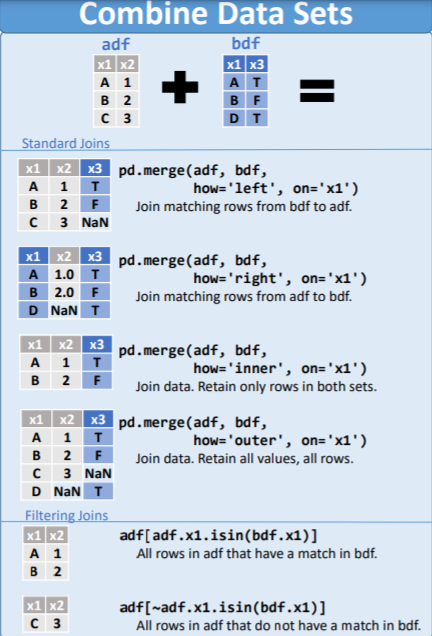

In [218]:
pd.DataFrame.merge?

Signature:
pd.DataFrame.merge(
    self,
    right: 'FrameOrSeriesUnion',
    how: 'str' = 'inner',
    on: 'IndexLabel | None' = None,
    left_on: 'IndexLabel | None' = None,
    right_on: 'IndexLabel | None' = None,
    left_index: 'bool' = False,
    right_index: 'bool' = False,
    sort: 'bool' = False,
    suffixes: 'Suffixes' = ('_x', '_y'),
    copy: 'bool' = True,
    indicator: 'bool' = False,
    validate: 'str | None' = None,
) -> 'DataFrame'
Docstring:
Merge DataFrame or named Series objects with a database-style join.

A named Series object is treated as a DataFrame with a single named column.

The join is done on columns or indexes. If joining columns on
columns, the DataFrame indexes *will be ignored*. Otherwise if joining indexes
on indexes or indexes on a column or columns, the index will be passed on.
When performing a cross merge, no column specifications to merge on are
allowed.

Parameters
----------
right : DataFrame or named Series
    Object to merge with.
how 

In [358]:
# let's join the two school tables
schools = schools_latlong.merge(schools_postcode, on='BUILDING_N', how ='outer')
schools

,BUILDING_N,latitude,longitude,longlat,category,HOUSE_BLK_NO,ROAD_NAME,POSTAL_CODE
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,1.319923,103.834958,"103.834958 , 1.319923",OTHER,80,BARKER ROAD,309937.0
1,AI TONG SCHOOL,1.360583,103.83302,"103.83302 , 1.360583",OTHER,100,BRIGHT HILL DRIVE,579646.0
2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,"103.824425 , 1.291334",PRIMARY SCHOOL,2A,PRINCE CHARLES CRESCENT,159016.0
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),1.319662,103.835941,"103.835941 , 1.319662",OTHER,60,BARKER ROAD,309919.0
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,1.301061,103.78131,"103.78131 , 1.301061",OTHER,119,DOVER ROAD,139656.0
...,...,...,...,...,...,...,...,...
149,CANOSSA CONVENT PRIMARY SCHOOL (U/C),NaN,NaN,NaN,NaN,1,SALLIM ROAD,387621.0
150,CANOSSIAN SCHOOL,NaN,NaN,NaN,NaN,1,SALLIM ROAD,387621.0
151,TANJONG KATONG GIRLS' SCHOOL,NaN,NaN,NaN,NaN,20,DUNMAN LANE,439272.0
152,MARIS STELLA HIGH SCHOOL,NaN,NaN,NaN,NaN,80,BARTLEY ROAD,539786.0


In [359]:
schools['latitude'].isnull().values.any()

True

### Use Geocoder (optional)

In [360]:
import requests

In [361]:
address ="revenue"
responses = requests.get(f'https://developers.onemap.sg/commonapi/search?searchVal={address}&returnGeom=Y&getAddrDetails=Y&pageNum=1')

In [362]:
if responses.status_code == 200:
    print(responses.json())

{'found': 1, 'totalNumPages': 1, 'pageNum': 1, 'results': [{'SEARCHVAL': 'REVENUE HOUSE', 'BLK_NO': '55', 'ROAD_NAME': 'NEWTON ROAD', 'BUILDING': 'REVENUE HOUSE', 'ADDRESS': '55 NEWTON ROAD REVENUE HOUSE SINGAPORE 307987', 'POSTAL': '307987', 'X': '28983.3887861837', 'Y': '33531.1155955307', 'LATITUDE': '1.31951800264427', 'LONGITUDE': '103.842154838338', 'LONGTITUDE': '103.842154838338'}]}


In [363]:
result = pd.json_normalize(responses.json())['results']
result[0][0]["ADDRESS"]

'55 NEWTON ROAD REVENUE HOUSE SINGAPORE 307987'

In [364]:
found = pd.json_normalize(responses.json())['found']
found[0]

1

In [365]:
def geocode_schools(building_name):
    responses = requests.get(f'https://developers.onemap.sg/commonapi/search?searchVal={building_name}&returnGeom=Y&getAddrDetails=Y&pageNum=1')
    
    if responses.status_code != 200:
        return "error"
    
    result = pd.json_normalize(responses.json())['results']
    found = pd.json_normalize(responses.json())['found']
    if found[0] > 0:
        return result[0][0]["ADDRESS"]+","+ result[0][0]["LONGITUDE"] + "," + result[0][0]["LATITUDE"]
    else:
        return ""

In [366]:
schools["address_longlat"] = schools["BUILDING_N"].apply(geocode_schools)

In [324]:
schools

,BUILDING_N,latitude,longitude,longlat,category,HOUSE_BLK_NO,ROAD_NAME,POSTAL_CODE,address,address_longlat
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,1.319923,103.834958,"103.834958 , 1.319923",OTHER,80,BARKER ROAD,309937.0,,
1,AI TONG SCHOOL,1.360583,103.83302,"103.83302 , 1.360583",OTHER,100,BRIGHT HILL DRIVE,579646.0,100 BRIGHT HILL DRIVE AI TONG SCHOOL SINGAPORE...,100 BRIGHT HILL DRIVE AI TONG SCHOOL SINGAPORE...
2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,"103.824425 , 1.291334",PRIMARY SCHOOL,2A,PRINCE CHARLES CRESCENT,159016.0,2A PRINCE CHARLES CRESCENT ALEXANDRA PRIMARY S...,2A PRINCE CHARLES CRESCENT ALEXANDRA PRIMARY S...
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),1.319662,103.835941,"103.835941 , 1.319662",OTHER,60,BARKER ROAD,309919.0,60 BARKER ROAD ANGLO-CHINESE SCHOOL (BARKER RO...,60 BARKER ROAD ANGLO-CHINESE SCHOOL (BARKER RO...
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,1.301061,103.78131,"103.78131 , 1.301061",OTHER,119,DOVER ROAD,139656.0,,
...,...,...,...,...,...,...,...,...,...,...
149,CANOSSA CONVENT PRIMARY SCHOOL (U/C),NaN,NaN,NaN,NaN,1,SALLIM ROAD,387621.0,,
150,CANOSSIAN SCHOOL,NaN,NaN,NaN,NaN,1,SALLIM ROAD,387621.0,1 SALLIM ROAD CANOSSIAN SCHOOL SINGAPORE 387621,1 SALLIM ROAD CANOSSIAN SCHOOL SINGAPORE 38762...
151,TANJONG KATONG GIRLS' SCHOOL,NaN,NaN,NaN,NaN,20,DUNMAN LANE,439272.0,20 DUNMAN LANE TANJONG KATONG GIRLS' SCHOOL SI...,20 DUNMAN LANE TANJONG KATONG GIRLS' SCHOOL SI...
152,MARIS STELLA HIGH SCHOOL,NaN,NaN,NaN,NaN,80,BARTLEY ROAD,539786.0,25 MOUNT VERNON ROAD MARIS STELLA HIGH SCHOOL ...,25 MOUNT VERNON ROAD MARIS STELLA HIGH SCHOOL ...


In [367]:
schools[['address','long_onemap','lat_onemap','none']] = schools['address_longlat'].str.split(',',expand=True)

In [341]:
# schools.drop(['address','long_onemap','lat_onemap'], axis=1, inplace=True)
# del schools['none']

In [368]:
schools

,BUILDING_N,latitude,longitude,longlat,category,HOUSE_BLK_NO,ROAD_NAME,POSTAL_CODE,address_longlat,address,long_onemap,lat_onemap,none
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,1.319923,103.834958,"103.834958 , 1.319923",OTHER,80,BARKER ROAD,309937.0,,,None,None,None
1,AI TONG SCHOOL,1.360583,103.83302,"103.83302 , 1.360583",OTHER,100,BRIGHT HILL DRIVE,579646.0,100 BRIGHT HILL DRIVE AI TONG SCHOOL SINGAPORE...,100 BRIGHT HILL DRIVE AI TONG SCHOOL SINGAPORE...,103.833020333986,1.3605834338904,None
2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,"103.824425 , 1.291334",PRIMARY SCHOOL,2A,PRINCE CHARLES CRESCENT,159016.0,2A PRINCE CHARLES CRESCENT ALEXANDRA PRIMARY S...,2A PRINCE CHARLES CRESCENT ALEXANDRA PRIMARY S...,103.824424680531,1.29133439161334,None
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),1.319662,103.835941,"103.835941 , 1.319662",OTHER,60,BARKER ROAD,309919.0,60 BARKER ROAD ANGLO-CHINESE SCHOOL (BARKER RO...,60 BARKER ROAD ANGLO-CHINESE SCHOOL (BARKER RO...,103.835772689988,1.31961649151328,None
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,1.301061,103.78131,"103.78131 , 1.301061",OTHER,119,DOVER ROAD,139656.0,,,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,CANOSSA CONVENT PRIMARY SCHOOL (U/C),NaN,NaN,NaN,NaN,1,SALLIM ROAD,387621.0,,,None,None,None
150,CANOSSIAN SCHOOL,NaN,NaN,NaN,NaN,1,SALLIM ROAD,387621.0,1 SALLIM ROAD CANOSSIAN SCHOOL SINGAPORE 38762...,1 SALLIM ROAD CANOSSIAN SCHOOL SINGAPORE 387621,103.881050911498,1.32685879628177,None
151,TANJONG KATONG GIRLS' SCHOOL,NaN,NaN,NaN,NaN,20,DUNMAN LANE,439272.0,20 DUNMAN LANE TANJONG KATONG GIRLS' SCHOOL SI...,20 DUNMAN LANE TANJONG KATONG GIRLS' SCHOOL SI...,103.895820094229,1.30821274627283,None
152,MARIS STELLA HIGH SCHOOL,NaN,NaN,NaN,NaN,80,BARTLEY ROAD,539786.0,25 MOUNT VERNON ROAD MARIS STELLA HIGH SCHOOL ...,25 MOUNT VERNON ROAD MARIS STELLA HIGH SCHOOL ...,103.877852484979,1.34139473351039,None


In [369]:
# after joining the two cvs files, some latlong information is NA, as school_postcode does not have latlong info.
# to address this issue, we use latlong information from OneMap API to replace
schools.loc[(schools['latitude'].isnull()) & (~schools['lat_onemap'].isnull()),'latitude'] = schools['lat_onemap']
schools.loc[(schools['longitude'].isnull()) & (~schools['long_onemap'].isnull()),'longitude'] = schools['long_onemap']

In [371]:
schools['longitude'].isnull().values.any()

True

In [373]:
schools['longitude'].isnull().values.sum()

8

In [402]:
# there are still some null data
# these 8 items need manual work. for simplicity, we remove these rows
schools_clean = schools[(~schools['longitude'].isna()) & (~schools['latitude'].isna())]

In [403]:
schools_clean

,BUILDING_N,latitude,longitude,longlat,category,HOUSE_BLK_NO,ROAD_NAME,POSTAL_CODE,address_longlat,address,long_onemap,lat_onemap,none
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,1.319923,103.834958,"103.834958 , 1.319923",OTHER,80,BARKER ROAD,309937.0,,,None,None,None
1,AI TONG SCHOOL,1.360583,103.83302,"103.83302 , 1.360583",OTHER,100,BRIGHT HILL DRIVE,579646.0,100 BRIGHT HILL DRIVE AI TONG SCHOOL SINGAPORE...,100 BRIGHT HILL DRIVE AI TONG SCHOOL SINGAPORE...,103.833020333986,1.3605834338904,None
2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,"103.824425 , 1.291334",PRIMARY SCHOOL,2A,PRINCE CHARLES CRESCENT,159016.0,2A PRINCE CHARLES CRESCENT ALEXANDRA PRIMARY S...,2A PRINCE CHARLES CRESCENT ALEXANDRA PRIMARY S...,103.824424680531,1.29133439161334,None
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),1.319662,103.835941,"103.835941 , 1.319662",OTHER,60,BARKER ROAD,309919.0,60 BARKER ROAD ANGLO-CHINESE SCHOOL (BARKER RO...,60 BARKER ROAD ANGLO-CHINESE SCHOOL (BARKER RO...,103.835772689988,1.31961649151328,None
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,1.301061,103.78131,"103.78131 , 1.301061",OTHER,119,DOVER ROAD,139656.0,,,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,SAINT CLARE SCHOOL,1.2735979712329,103.833361561073,NaN,NaN,102B,UPPER ALJUNIED ROAD,367881.0,10 RAEBURN PARK SAINT CLARE SCHOOL FOR SPECIAL...,10 RAEBURN PARK SAINT CLARE SCHOOL FOR SPECIAL...,103.833361561073,1.2735979712329,None
150,CANOSSIAN SCHOOL,1.32685879628177,103.881050911498,NaN,NaN,1,SALLIM ROAD,387621.0,1 SALLIM ROAD CANOSSIAN SCHOOL SINGAPORE 38762...,1 SALLIM ROAD CANOSSIAN SCHOOL SINGAPORE 387621,103.881050911498,1.32685879628177,None
151,TANJONG KATONG GIRLS' SCHOOL,1.30821274627283,103.895820094229,NaN,NaN,20,DUNMAN LANE,439272.0,20 DUNMAN LANE TANJONG KATONG GIRLS' SCHOOL SI...,20 DUNMAN LANE TANJONG KATONG GIRLS' SCHOOL SI...,103.895820094229,1.30821274627283,None
152,MARIS STELLA HIGH SCHOOL,1.34139473351039,103.877852484979,NaN,NaN,80,BARTLEY ROAD,539786.0,25 MOUNT VERNON ROAD MARIS STELLA HIGH SCHOOL ...,25 MOUNT VERNON ROAD MARIS STELLA HIGH SCHOOL ...,103.877852484979,1.34139473351039,None


In [404]:
schools_clean.drop(['longlat','category','address_longlat','long_onemap','lat_onemap','none'], axis = 1, inplace =True)

C:\Users\user\AppData\Roaming\Python\Python39\site-packages\pandas\core\frame.py:4901: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [406]:
schools_clean.to_csv("Output/schools_with_address.csv")

In [411]:
# there are a lot of other useful methods such as change columns names
schools_clean

,BUILDING_N,latitude,longitude,HOUSE_BLK_NO,ROAD_NAME,POSTAL_CODE,address
0,ACS OLDHAM HALL - THE BOARDING SCHOOL,1.319923,103.834958,80,BARKER ROAD,309937.0,
1,AI TONG SCHOOL,1.360583,103.83302,100,BRIGHT HILL DRIVE,579646.0,100 BRIGHT HILL DRIVE AI TONG SCHOOL SINGAPORE...
2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,2A,PRINCE CHARLES CRESCENT,159016.0,2A PRINCE CHARLES CRESCENT ALEXANDRA PRIMARY S...
3,ANGLO-CHINESE SCHOOL (BARKER ROAD),1.319662,103.835941,60,BARKER ROAD,309919.0,60 BARKER ROAD ANGLO-CHINESE SCHOOL (BARKER RO...
4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,1.301061,103.78131,119,DOVER ROAD,139656.0,
...,...,...,...,...,...,...,...
146,SAINT CLARE SCHOOL,1.2735979712329,103.833361561073,102B,UPPER ALJUNIED ROAD,367881.0,10 RAEBURN PARK SAINT CLARE SCHOOL FOR SPECIAL...
150,CANOSSIAN SCHOOL,1.32685879628177,103.881050911498,1,SALLIM ROAD,387621.0,1 SALLIM ROAD CANOSSIAN SCHOOL SINGAPORE 387621
151,TANJONG KATONG GIRLS' SCHOOL,1.30821274627283,103.895820094229,20,DUNMAN LANE,439272.0,20 DUNMAN LANE TANJONG KATONG GIRLS' SCHOOL SI...
152,MARIS STELLA HIGH SCHOOL,1.34139473351039,103.877852484979,80,BARTLEY ROAD,539786.0,25 MOUNT VERNON ROAD MARIS STELLA HIGH SCHOOL ...


### Exercise Pandas

Let's use Pandas to manipulate a real geospatial dataset: **Singapore 2017 social-economical data aggregated by subzones**. 

Although we have not introduced Geopandas yet, we can first deal with the attribute table. 

1. Let's first use geopands to read the shapefile.

#### Read the Shapefile

In [416]:
sz = gpd.read_file('Data/MP14_Subzone_SE_2017.shp')

#### Edit Columns

2. Add a new field (or column) called "Age_0to6" which equals to the sum of three columns: BET0TO2, BET3TO4, and BET5TO6. One way of doing this is as below. You can use other methods.

In [417]:
sz['Age_0to6']= sz.filter(regex='^BET', axis=1).iloc[:,:3].sum(axis=1)

3. Similarly, add two new fields:

* "Age_20to29" equals to the sum of two columns: BET20TO24, BET25TO29
* "Age_45to54" equals to the sum of all columns between BET45TO49 and BET50TO54

In [ ]:
###############################################
### add your codes here

sz['Age_20to29'] = 
sz['Age_45to54'] = 

###############################################

4. Change the column name 'OVER85' into 'Age_over85'.

In [ ]:
###############################################
### add your codes here
sz.rename(####)

###############################################

5. Delete three columns: BET0TO2, BET3TO4, and BET5TO6.

In [419]:
###############################################
### add your codes here
sz.drop(#######)

    
###############################################

6. Creat a new categorical column called "has_pri_sch_stu", which indicates whether a subzone has primary school students.
* If a subzone has no lower or upper primary school students (UPPER_PRIM=0 and LOWER_PRIM=0), has_pri_sch_stu = False
* otherwise, has_pri_sch_stu = True

In [433]:
###############################################
### add your codes here

sz['has_pri_sch_stu']= #### 
sz.loc[#####,#######] =  ####

###############################################

7. Update the value of the column has_pri_sch_stu

* True -> "Has primary school students"
* False -> "Has no primary school students"

Hint: use DataFrame method `map`

In [457]:
###############################################
### add your codes here



###############################################

#### Group and Summarize

7. Summarize the sum and mean of the avearage annual value (AV) for 2-room HDB (i.e., the column Avg_AV_2rm) grouped by the column "has_pri_sch_stu".

In [ ]:
###############################################
### add your codes here



###############################################

### Pandas Series Object (optional)

The Series wraps both a sequence of values and a sequence of indices, which we can access with the values and index attributes. The values are simply a NumPy array. The essential difference between numpy array and pandas series is: 
* the Numpy Array has an implicitly defined integer index used to access the values.
* the Pandas Series has an explicitly defined index associated with the values.

In [3]:
data = pd.Series([0.25, 0.5, 0.75, 1.0],
                 index=['a', 'b', 'c', 'd'])
data

a    0.25
b    0.50
c    0.75
d    1.00
dtype: float64

In [4]:
print(data.b)
print(data['b'])

0.5
0.5


We can think of a Pandas Series a bit like a specialization of a Python dictionary. 

A dictionary is a structure that maps **arbitrary keys** to a set of **arbitrary values**, and a Series is a structure which maps **typed keys** to a set of **typed values**. The type-specific information of a Pandas Series makes it much more efficient than Python dictionaries.

In [9]:
# Python Dictionary
population_dict = {'PHILLIP': 10,
                   'TIONG BAHRU': 12830,
                   'CRAWFORD': 9200,
                   'MOUNT EMILY': 1210,
                   'BOULEVARD': 420}
population = pd.Series(population_dict)
population

PHILLIP           10
TIONG BAHRU    12830
CRAWFORD        9200
MOUNT EMILY     1210
BOULEVARD        420
dtype: int64

Unlike a dictionary, the Series supports array-style operations such as slicing:

In [10]:
population['PHILLIP':'MOUNT EMILY'] # python dictionary doesn't support this. try population_dict['PHILLIP':'MOUNT EMILY']

PHILLIP           10
TIONG BAHRU    12830
CRAWFORD        9200
MOUNT EMILY     1210
dtype: int64

In [11]:
population['PHILLIP']

10

In [12]:
population.PHILLIP

10

In [13]:
'CRAWFORD' in population

True

In [46]:
9200 in population

False

In [14]:
# masking
population[(population > 1000) & (population < 10000)]

CRAWFORD       9200
MOUNT EMILY    1210
dtype: int64

In [15]:
# fancy indexing
population[['PHILLIP', 'CRAWFORD']]

PHILLIP       10
CRAWFORD    9200
dtype: int64

## GeoPandas

Geopandas is the defacto geospatial library in Python. It offers so many functionalities and integrates well with the Python Data Science ecosystem libraries. We can use Geopandas to effectively load, manipulate, and visualize geospatial data. These techniques are fundamental to the process of doing geospatial data science.

### Geographic Tables

Geographic tables can be thought of as a tab in a spreadsheet where one of the columns records geometric information. This data structure represents a single geographic object as a row of a table; each column in the table records information about the object, its attributes or features. 

In GIS, the word "feature" to mean an individual observation, since a "feature" in cartography is an entity on a map, and "attribute" to describe characteristics of that observation. In data science and machine learning, however, a feature is a column (i.e., a variable) and a sample is a row (a record). Throughout this course, for consistent terminology with QGIS, a feature refers to a measurement about an observation (a row), attributes are used to describe characteristics of this observation. 

We will still use the real geospatial dataset: **Singapore 2017 social-economical data aggregated by subzones**. The geographic table has been read in the previous exercise. Each row of this table is a single subzone. Each zone has 108 attributes as described in the excel.

In [463]:
sz.iloc[:,-5:]

,Ina_CPF_N,geometry,Age_0to6,has_pri_sch_stu,centroid
0,679,"POLYGON ((29099.021 29640.030, 29116.963 29625...",0,Has no primary school students,POINT (28831.781 29419.646)
1,1837,"POLYGON ((26750.092 29216.098, 26751.912 29173...",89,Has primary school students,POINT (26360.799 29384.143)
2,1721,"POLYGON ((29161.201 29723.071, 29189.033 29704...",1002,Has primary school students,POINT (29153.968 29158.044)
3,0,"POLYGON ((29814.107 29616.894, 29806.682 29593...",0,Has no primary school students,POINT (29706.724 29744.908)
4,0,"POLYGON ((30137.768 29843.194, 30138.417 29841...",0,Has no primary school students,POINT (29968.618 29572.762)
...,...,...,...,...,...
316,9684,"POLYGON ((35984.250 42426.523, 35819.539 42084...",7730,Has primary school students,POINT (35089.985 42728.275)
317,3205,"POLYGON ((21693.062 48119.514, 21702.562 48125...",725,Has primary school students,POINT (22147.036 48031.552)
318,193,"POLYGON ((29302.173 48931.391, 29141.750 48832...",139,Has primary school students,POINT (28352.477 48918.275)
319,1247,"POLYGON ((26219.892 50256.054, 26219.853 50247...",0,Has no primary school students,POINT (26945.068 49552.790)


when we plot the dataframe, the geometry column is used as the main shape to use in the plot:

matplotlib.axes._subplots.AxesSubplot

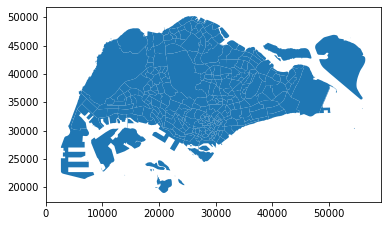

In [467]:
type(sz.plot())

`Axes` is the most basic and flexible unit for creating sub-plots. Axes allow placement of plots at any location in the figure. A given figure can contain many axes, but a given axes object can only be in one figure. The axes contain two axis objects 2D as well as, three-axis objects in the case of 3D. 

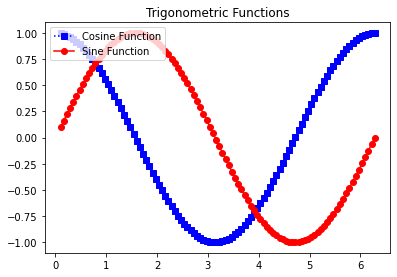

In [492]:
fig = plt.figure()
  
#[left, bottom, width, height]
ax = plt.axes([0.1, 0.1, 0.8, 0.8])

X = np.linspace(0.1,2*np.pi,100)
Y = np.cos(X)
S = np.sin(X)

# 'bs:' mentions blue color, square 
# marker with dotted line.
ax1 = ax.plot(X, Y, 'bs:') 
  
#'ro-' mentions red color, circle 
# marker with solid line.
ax2 = ax.plot(X, S, 'ro-') 
  
ax.legend(labels = ('Cosine Function', 
                    'Sine Function'), 
          loc = 'upper left')
  
ax.set_title("Trigonometric Functions")
  
plt.show()

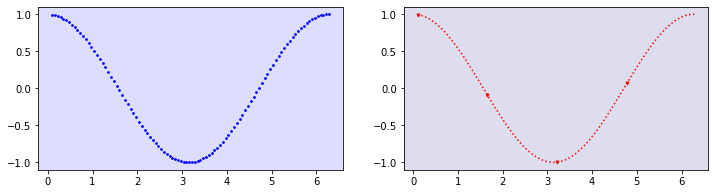

In [486]:
fig, ax = plt.subplots(1,2,figsize=(12,3))
ax[0].set_facecolor('#ddddff')
# ax.plot(X,Y,'o-r',ms=3,markevery=25)
ax[0].scatter(X,Y,s=3,color='b')

ax[1].set_facecolor('#ddddee')
ax[1].plot(X,Y,'v:r',ms=3,markevery=25)

The `geometry` column differentiates a geospatial table from a "normal" table (non-spatial table).

There are special functions to adjust the geometry. For example, if we wanted to represent each country using its *centroid*, a point in the middle of the shape, then we must take care to make sure that a new geometry column was set properly using the `set_geometry()` method.

In [493]:
sz['centroid'] = sz.geometry.centroid

Despite the fact that `centroid` is a geometry, it is not currently set as the geometry for our table. We can switch to the `centroid` column using the `set_geometry()` method. Finally, we can plot the centroid and the boundary of each country by switching the geometry column with `set_geometry`:

<AxesSubplot:>

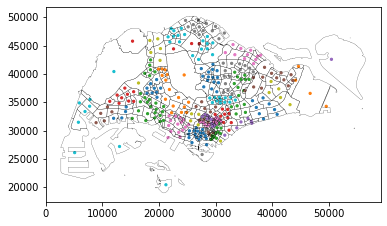

In [494]:
# Plot centroids
ax = sz.set_geometry('centroid')\
                .plot('PLN_AREA_N', 
                      markersize=5
                     )

# Plot polygons without color filling
sz.plot('PLN_AREA_N', 
                 ax=ax, 
                 facecolor='none', 
                 edgecolor='k', 
                 linewidth=.2
                )

Note how we can create a map by calling `.plot()` on a `GeoDataFrame`. We can thematically color each feature based on a column by passing the name of that column to the plot method (as we do on with `PLN_AREA_N` in this case).

Open Geospatial Consortium (OGC) has defined a set of "abstract" types that can be used to define any kind of geometry. The "simple features" specification defines the formal relationships between these types: 
* a `Point` is a zero-dimensional location with an x and y coordinate; 
* a `LineString` is a path composed of a set of more than one `Point`
* a `Polygon` is a surface that has at least one LineString that starts and stops with the same coordinate. 

All of these types *also* have `Multi` variants that indicate a collection of multiple geometries of the same type. 

Before we dive into the details of Geopandas methods, let's first figure out how to convert a CSV file into Geopandas dataframe.

### Convert CSV into GeoDataFrame tables 

In [495]:
schools_geoms = gpd.points_from_xy(x=schools_clean["longitude"],
                                    y=schools_clean["latitude"],
                                    crs="epsg:4326"
                                   )

In [496]:
schools = gpd.GeoDataFrame(schools_clean, geometry=schools_geoms)

In [497]:
# ensure that the two layers have the same crs
# here we have to transform the crs instead of set a new
central_schools_sf=schools.to_crs("epsg:3414")

And now `geometry` column stores `POINT` geometries:

<AxesSubplot:>

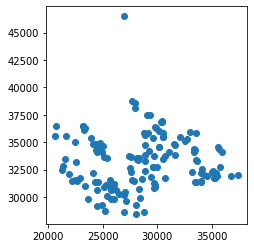

In [498]:
central_schools_sf.plot()

In [595]:
central_schools_sf['latitude'] = central_schools_sf['latitude'].astype(float)
central_schools_sf['longitude'] = central_schools_sf['longitude'].astype(float)

C:\Users\user\AppData\Roaming\Python\Python39\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<AxesSubplot:>

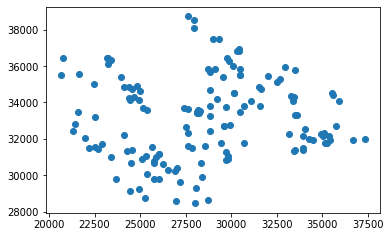

In [509]:
central_schools_sf.loc[central_schools_sf['latitude']!=central_schools_sf['latitude'].max()].plot()

In [596]:
central_schools_sf = central_schools_sf.loc[central_schools_sf['latitude']< central_schools_sf['latitude'].max()]

C:\Users\user\AppData\Roaming\Python\Python39\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python39\site-packages\seaborn\distributions.py:1182: UserWarning: The following kwargs were not used by contour: 'Label'
  cset = contour_func(


<AxesSubplot:xlabel='longitude', ylabel='latitude'>

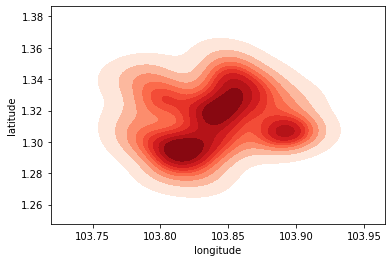

In [609]:
# ax = central_schools_sf.plot(color='k')
sns.kdeplot(central_schools_sf['longitude'], 
            central_schools_sf['latitude'],
            color='r', shade=True, Label='central schools',
            cmap="Reds")

<AxesSubplot:title={'center':'Central Schools'}>

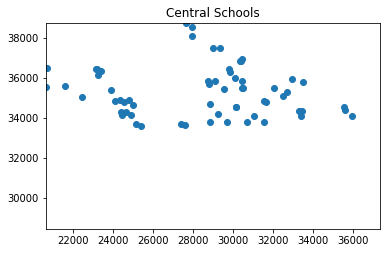

In [521]:
fig, ax = plt.subplots()
bd = central_schools_sf.total_bounds
xlim = ([bd[0],  bd[2]])
ylim = ([bd[1],  bd[3]])
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set(title='Central Schools')
central_schools_sf.query('latitude > 1.32').plot(ax =ax)

<AxesSubplot:>

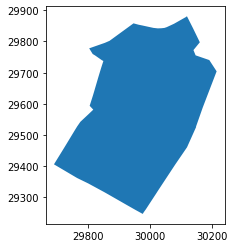

In [68]:
sz.query('SUBZONE_N == "RAFFLES PLACE"').plot()

<AxesSubplot:>

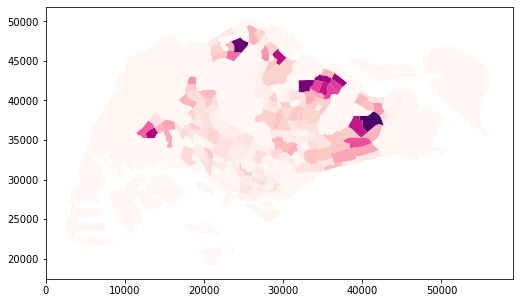

In [73]:
# some cmap codes 
# viridis, plasma, inferno, magma, cividis
# Greys, Purples, Blues, Greens, Oranges, Reds
# YlOrBr, OrRd, PuRd, RdPu, BuPu, GnBu, PuBu, YlGnBu, PuBuGn, BuGn, YlGn
# PiYg, PRGn, BrBG, PuOr, RdGy, RdBu, RdYlBu, Spectral, coolwarm, bwr, seismic
# twilight, twilight_shifted, hsv
# Pastel1, Pastel2, PAired, Accent, Dark2, Set1, Set2, Set3, tab10, tab20, tab20b, tab20c
sz.plot("BET5TO6", cmap='RdPu', figsize=(10, 5))
# We can also plot the  polygons with no fill color by using GeoDataFrame.boundary.plot()
# sz.boundary.plot()

<AxesSubplot:>

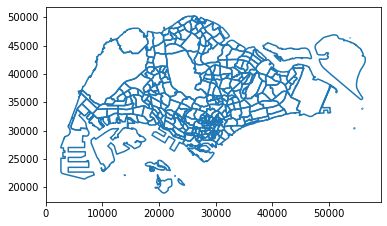

In [74]:
sz.boundary.plot()

<AxesSubplot:>

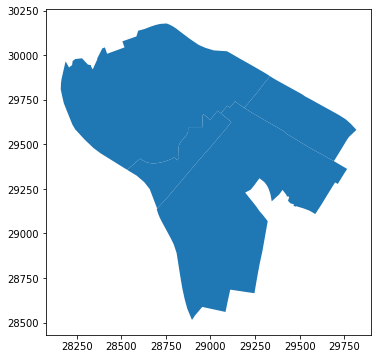

In [75]:
# we can choose one subzone to plot
sz.query('PLN_AREA_N == "OUTRAM"').plot(figsize=(12, 6))

<AxesSubplot:>

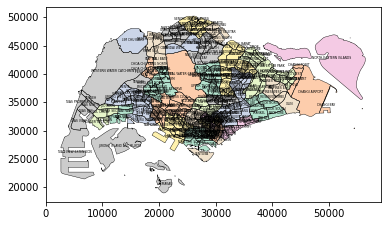

In [525]:
# add label
ax = sz.plot('PLN_AREA_N', cmap='Pastel2')
sz.apply(lambda x: ax.annotate(text=x.SUBZONE_N, xy=x.geometry.centroid.coords[0], ha='center', fontsize=3),axis=1);
sz.boundary.plot(ax=ax, figsize=(25, 14), color='Black', linewidth=.4)

### Spatial Join

In [532]:
gpd.sjoin?

Signature:
gpd.sjoin(
    left_df,
    right_df,
    how='inner',
    predicate='intersects',
    lsuffix='left',
    rsuffix='right',
    **kwargs,
)
Docstring:
Spatial join of two GeoDataFrames.

See the User Guide page :doc:`../../user_guide/mergingdata` for details.


Parameters
----------
left_df, right_df : GeoDataFrames
how : string, default 'inner'
    The type of join:

    * 'left': use keys from left_df; retain only left_df geometry column
    * 'right': use keys from right_df; retain only right_df geometry column
    * 'inner': use intersection of keys from both dfs; retain only
      left_df geometry column
predicate : string, default 'intersects'
    Binary predicate. Valid values are determined by the spatial index used.
    You can check the valid values in left_df or right_df as
    ``left_df.sindex.valid_query_predicates`` or
    ``right_df.sindex.valid_query_predicates``
    Replaces deprecated ``op`` parameter.
lsuffix : string, default 'left'
    Suffix to apply to

In [93]:
sz.sindex.valid_query_predicates

{None,
 'contains',
 'contains_properly',
 'covered_by',
 'covers',
 'crosses',
 'intersects',
 'overlaps',
 'touches',
 'within'}

In [533]:
joined= gpd.sjoin(sz,central_schools_sf, how="inner", predicate='intersects')

In [536]:
joined.sort_values('SUBZONE_N').head()

,SUBZONE_N,SUBZONE_C,PLN_AREA_N,PLN_AREA_C,REGION_N,REGION_C,BET0TO2,BET3TO4,BET5TO6,BET7TO9,...,has_pri_sch_stu,centroid,index_right,BUILDING_N,latitude,longitude,HOUSE_BLK_NO,ROAD_NAME,POSTAL_CODE,address
15,ALEXANDRA HILL,BMSZ07,BUKIT MERAH,BM,CENTRAL REGION,CR,324,235,190,373,...,Has primary school students,POINT (25358.821 29991.384),20,BUKIT MERAH SECONDARY SCHOOL,1.285784,103.813023,10,LENGKOK BAHRU,159050.0,10 LENGKOK BAHRU BUKIT MERAH SECONDARY SCHOOL ...
15,ALEXANDRA HILL,BMSZ07,BUKIT MERAH,BM,CENTRAL REGION,CR,324,235,190,373,...,Has primary school students,POINT (25358.821 29991.384),86,MOE SCHOOL CLUSTER CENTRE,1.287995,103.809676,5,HOY FATT ROAD,159505.0,5 HOY FATT ROAD MOE SCHOOL CLUSTER CENTRE SING...
21,ALEXANDRA NORTH,BMSZ06,BUKIT MERAH,BM,CENTRAL REGION,CR,68,48,35,48,...,Has primary school students,POINT (26548.251 30519.392),2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,2A,PRINCE CHARLES CRESCENT,159016.0,2A PRINCE CHARLES CRESCENT ALEXANDRA PRIMARY S...
21,ALEXANDRA NORTH,BMSZ06,BUKIT MERAH,BM,CENTRAL REGION,CR,68,48,35,48,...,Has primary school students,POINT (26548.251 30519.392),32,CRESCENT GIRLS' SCHOOL,1.293319,103.817544,357,TANGLIN ROAD,247961.0,357 TANGLIN ROAD CRESCENT GIRLS' SCHOOL SINGAP...
125,ALJUNIED,GLSZ04,GEYLANG,GL,CENTRAL REGION,CR,782,549,634,1097,...,Has primary school students,POINT (33592.576 32970.830),56,GEYLANG METHODIST SCHOOL (SECONDARY),1.317671,103.882673,2,GEYLANG EAST CENTRAL,389705.0,2 GEYLANG EAST CENTRAL GEYLANG METHODIST SCHOO...


In [562]:
school_number = joined[['SUBZONE_N','index_right']].groupby('SUBZONE_N').agg('count').reset_index()
school_number

,SUBZONE_N,index_right
0,ALEXANDRA HILL,2
1,ALEXANDRA NORTH,2
2,ALJUNIED,5
3,ANAK BUKIT,3
4,BALESTIER,3
...,...,...
56,TOA PAYOH CENTRAL,1
57,TOA PAYOH WEST,3
58,ULU PANDAN,2
59,UPPER THOMSON,3


In [563]:
school_number.rename(columns={'index_right':'school_number'},inplace=True)

In [567]:
school_number.sort_values('school_number',ascending=False)

,SUBZONE_N,school_number
29,MALCOLM,7
25,KATONG,7
30,MARGARET DRIVE,6
7,BISHAN EAST,5
18,HILLCREST,5
...,...,...
22,JOO SENG,1
27,LORONG 8 TOA PAYOH,1
36,MOUNT EMILY,1
34,MONK'S HILL,1


In [582]:
sz_joined = sz.merge(school_number, on='SUBZONE_N', how ='left')
sz_joined

,SUBZONE_N,SUBZONE_C,PLN_AREA_N,PLN_AREA_C,REGION_N,REGION_C,BET0TO2,BET3TO4,BET5TO6,BET7TO9,...,Q,R,S,VariableX,Ina_CPF_N,geometry,Age_0to6,has_pri_sch_stu,centroid,school_number
0,PEOPLE'S PARK,OTSZ02,OUTRAM,OT,CENTRAL REGION,CR,0,0,0,0,...,14,0,22,532,679,"POLYGON ((29099.021 29640.030, 29116.963 29625...",0,Has no primary school students,POINT (28831.781 29419.646),NaN
1,BUKIT MERAH,BMSZ02,BUKIT MERAH,BM,CENTRAL REGION,CR,29,22,38,58,...,51,0,24,776,1837,"POLYGON ((26750.092 29216.098, 26751.912 29173...",89,Has primary school students,POINT (26360.799 29384.143),NaN
2,CHINATOWN,OTSZ03,OUTRAM,OT,CENTRAL REGION,CR,386,294,322,432,...,221,0,189,653,1721,"POLYGON ((29161.201 29723.071, 29189.033 29704...",1002,Has primary school students,POINT (29153.968 29158.044),NaN
3,PHILLIP,DTSZ04,DOWNTOWN CORE,DT,CENTRAL REGION,CR,0,0,0,0,...,0,0,0,807,0,"POLYGON ((29814.107 29616.894, 29806.682 29593...",0,Has no primary school students,POINT (29706.724 29744.908),NaN
4,RAFFLES PLACE,DTSZ05,DOWNTOWN CORE,DT,CENTRAL REGION,CR,0,0,0,0,...,0,0,0,857,0,"POLYGON ((30137.768 29843.194, 30138.417 29841...",0,Has no primary school students,POINT (29968.618 29572.762),NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
316,MATILDA,PGSZ03,PUNGGOL,PG,NORTH-EAST REGION,NER,3382,2366,1982,2188,...,1259,105,676,538,9684,"POLYGON ((35984.250 42426.523, 35819.539 42084...",7730,Has primary school students,POINT (35089.985 42728.275),NaN
317,NORTH COAST,WDSZ09,WOODLANDS,WD,NORTH REGION,NR,292,213,220,310,...,338,57,291,725,3205,"POLYGON ((21693.062 48119.514, 21702.562 48125...",725,Has primary school students,POINT (22147.036 48031.552),NaN
318,SEMBAWANG STRAITS,SBSZ06,SEMBAWANG,SB,NORTH REGION,NR,64,30,45,70,...,35,0,51,602,193,"POLYGON ((29302.173 48931.391, 29141.750 48832...",139,Has primary school students,POINT (28352.477 48918.275),NaN
319,THE WHARVES,SBSZ07,SEMBAWANG,SB,NORTH REGION,NR,0,0,0,0,...,0,0,0,819,1247,"POLYGON ((26219.892 50256.054, 26219.853 50247...",0,Has no primary school students,POINT (26945.068 49552.790),NaN


In [583]:
sz_joined['school_number'] = sz_joined['school_number'].fillna(0)

In [586]:
sz_joined['school_number'].value_counts()

0.0    260
2.0     21
1.0     20
3.0      9
4.0      4
5.0      4
7.0      2
6.0      1
Name: school_number, dtype: int64

### Choropleth map

Choropleth maps are useufl as they display non-geographic attributes on a geographic map. Choropleth maps represent data at the region level, and are appropriate for areal unit data where each observation combines a value of an attribute and a geometric figure.

In [107]:
import mapclassify

#### Quantitative data classification 

The first step of making a choropleth map is to choose attribute values (a column of geographic table) and classify it into mutually exclusive and exhaustive groups. 

##### Equal Intervals
In equal intervals", each of the bins has the same width in the value space. Equal intervals are simple to use and ease to
interpret. However, in some cases, equal intervals can result in one or more classes being sparse. This is clearly the case in our dataset.

In [112]:
sz['BET0TO2'].describe()

count     321.000000
mean      358.535826
std       596.196832
min         0.000000
25%         0.000000
50%       120.000000
75%       470.000000
max      3590.000000
Name: BET0TO2, dtype: float64

In [115]:
ei5 = mapclassify.EqualInterval(sz['BET0TO2'], k=5)
ei5

EqualInterval             

     Interval        Count
--------------------------
[   0.00,  718.00] |   267
( 718.00, 1436.00] |    39
(1436.00, 2154.00] |     6
(2154.00, 2872.00] |     3
(2872.00, 3590.00] |     6

This value of $k=5$ also coincides with the default classification
in the `seaborn` histogram. It should also be noted that the first class is closed on the lower bound.

##### Quantiles
Each class will have approximately $\mid\frac{n}{k}\mid$ observations using the quantile
classifier. If $k=5$ the sample quintiles are used to define the upper limits of
each class resulting in the following classification:

In [127]:
q5 = mapclassify.Quantiles(sz.BET0TO2, k=5) # sz.BET0TO2 equals sz['BET0TO2'] 
q5

Quantiles                 

     Interval        Count
--------------------------
[   0.00,    0.00] |   106
(   0.00,   30.00] |    23
(  30.00,  230.00] |    64
( 230.00,  600.00] |    64
( 600.00, 3590.00] |    64

Note that while the numbers of values in each class are roughly equal, the
widths of the first four intervals are rather different:

In [128]:
q5.bins[1:]-q5.bins[:-1]

array([  30.,  200.,  370., 2990.])

While quantiles does avoid the pitfall of sparse classes, this classification is
not problem free. The varying widths of the intervals can be markedly different
which can lead to problems of interpretation. A second challenge facing quantiles
arises when there are a large number of duplicate values in the distribution
such that the limits for one or more classes become ambiguous. For example, if one had a variable with $n=20$ but 10 of the observations took on the same value which was the minimum observed, then for values of $k>2$, the class boundaries become ill-defined since a simple rule of splitting at the $n/k$ ranked observed value would depend upon how ties are treated when ranking.

In [14]:
np.random.seed(12345)
x = np.random.randint(0,10,20)
x[0:10] = x.min()
x

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 9, 7, 6, 0, 2, 9, 1, 2, 6, 7])

In [15]:
ties = mapclassify.Quantiles(x, k=5)
ties

C:\Users\user\AppData\Roaming\Python\Python39\site-packages\mapclassify\classifiers.py:234: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\Users\user\AppData\Roaming\Python\Python39\site-packages\mapclassify\classifiers.py:237: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


Quantiles           

  Interval     Count
--------------------
[0.00, 0.00] |    11
(0.00, 1.40] |     1
(1.40, 6.20] |     4
(6.20, 9.00] |     4

In [14]:
x

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 9, 7, 6, 0, 2, 9, 1, 2, 6, 7])

##### Mean-standard deviation

Our third classifier uses the sample mean $\bar{x} =
\frac{1}{n} \sum_{i=1}^n x_i$ and sample standard deviation $s = \sqrt{
\frac{1}{n-1} \sum_{i=1}^n (x_i - \bar{x})  }$ to define class boundaries as
some distance from the sample mean, with the distance being a multiple of the
standard deviation. For example, a common definition for $k=5$ is to set the
upper limit of the first class to two standard deviations ($c_{0}^u = \bar{x} - 2 s$), and the intermediate
classes to have upper limits within one standard deviation ($c_{1}^u = \bar{x}-s,\ c_{2}^u = \bar{x}+s, \ c_{3}^u
= \bar{x}+2s$). Any values greater (smaller) than two standard deviations above (below) the mean
are placed into the top (bottom) class.

In [131]:
msd = mapclassify.StdMean(sz.BET0TO2)
msd

StdMean                   

     Interval        Count
--------------------------
(   -inf, -833.86] |     0
(-833.86, -237.66] |     0
(-237.66,  954.73] |   283
( 954.73, 1550.93] |    24
(1550.93, 3590.00] |    14

This classifier is best used when data is normally distributed and when the sample mean is meaningful. This is
not the case for our population age data. 

##### Maximum Breaks

The maximum breaks classifier decides where to set the break points between
classes by considering the difference between sorted values. Rather
than considering a value of the dataset in itself, it looks at how apart each
value is from the next one in the sorted sequence. 

In [132]:
mb5 = mapclassify.MaximumBreaks(sz.BET0TO2, k=5)
mb5

MaximumBreaks             

     Interval        Count
--------------------------
[   0.00, 1605.00] |   307
(1605.00, 2065.00] |     5
(2065.00, 2730.00] |     3
(2730.00, 3085.00] |     2
(3085.00, 3590.00] |     4

Maximum breaks is an appropriate approach when we are interested in making sure
observations in each class are separated from those in neighboring classes. As
such, it works well in cases where the distribution of values is not unimodal.

Some other methdos of claasification include Box-Plot,Head-Tail Breaks,Jenks Caspall,Fisher Jenks, Max-p, please refer to [Python Data Science Handbook](https://github.com/jakevdp/PythonDataScienceHandbook)  


#### Color

The second step of making a choropleth map is to select the symbolization and color scheme. 

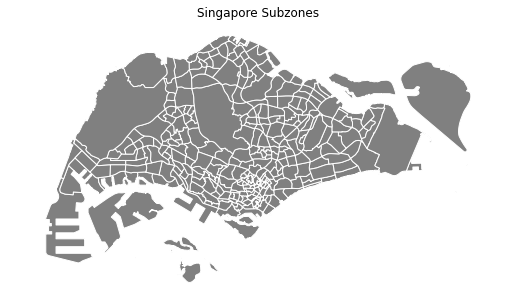

In [112]:
f, ax = plt.subplots(1, figsize=(9, 5))
sz.plot(ax=ax, color='grey', edgecolor='white')
ax.set_axis_off()
ax.set_title('Singapore Subzones')
plt.axis('equal')
plt.show()

Note that the spatial units for these subzone are not homogeneous in their shapes. The spatial distribution is complicated to evaluate from a visual perspective, as our our attention tends to be drawn to the larger polygons. 

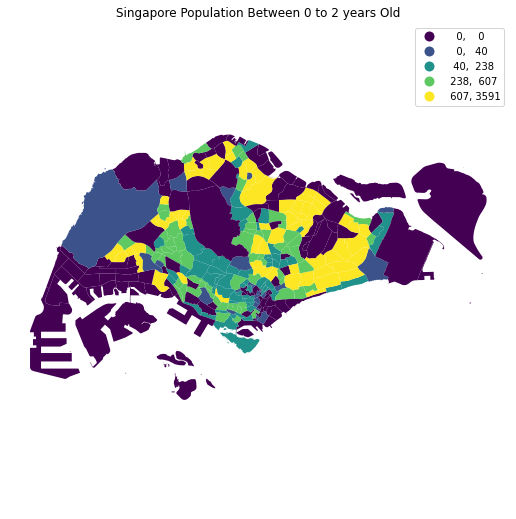

In [113]:
f, ax = plt.subplots(1, figsize=(9, 9))
sz.plot(ax=ax, column='BET0TO2', legend=True, scheme='Quantiles',legend_kwds={'fmt':'{:.0f}'})
ax.set_axis_off()
ax.set_title('Singapore Population Between 0 to 2 years Old')
plt.axis('equal')
plt.show()

The default color map used by `geopandas` is viridis, which is a multi-hue
sequential scheme, with the darker (lighter) hues representing lower (higher)
values for the attribute in question. The choice of a color scheme for a
choropleth map should be based on the type of variable under consideration
{cite}`Brewer1997mapping`. Generally, a distinction is drawn between three
types of numerical attributes:

- sequential
- diverging
- qualitative

##### Sequential Color Schemes

Population size is a *sequential* attribute. To choose an appropriate sequential scheme we can override the `cmap` parameter:

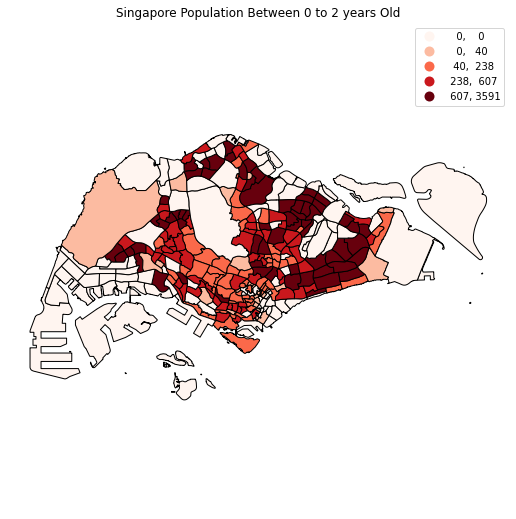

In [120]:
f, ax = plt.subplots(1, figsize=(9, 9))
sz.plot(ax=ax, column='BET0TO2', legend=True, scheme='Quantiles', legend_kwds={'fmt':'{:.0f}'}, cmap='Reds', edgecolor="k")
ax.set_axis_off()
ax.set_title('Singapore Population Between 0 to 2 years Old')
plt.axis('equal')
plt.show()

In [122]:
sz.columns

Index(['SUBZONE_N', 'SUBZONE_C', 'PLN_AREA_N', 'PLN_AREA_C', 'REGION_N',
       'REGION_C', 'BET0TO2', 'BET3TO4', 'BET5TO6', 'BET7TO9',
       ...
       'N', 'O', 'P', 'Q', 'R', 'S', 'VariableX', 'Ina_CPF_N', 'geometry',
       'centroid'],
      dtype='object', length=107)

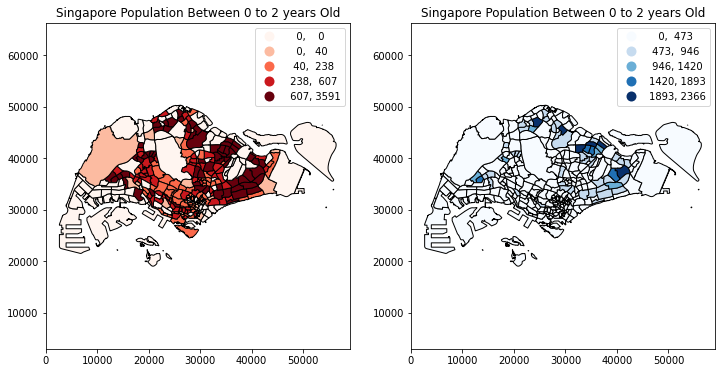

In [123]:
f, (ax1,ax2) = plt.subplots(1,2,figsize=(12, 6))

sz.plot(ax = ax1, column='BET0TO2', legend=True, scheme='Quantiles', legend_kwds={'fmt':'{:.0f}'}, cmap='Reds', edgecolor="k")
ax1.set_title('Singapore Population Between 0 to 2 years Old')
ax1.axis('equal')

sz.plot(ax = ax2,column='BET3TO4', legend=True, scheme='equal_interval', legend_kwds={'fmt':'{:.0f}'}, cmap='Blues', edgecolor="k")
ax2.set_title('Singapore Population Between 0 to 2 years Old')
ax2.axis('equal')

plt.show()

##### Diverging Color Schemes

Diverging color schemes are useful when we want to place equal emphasis on mid-range critical values as
well as extremes at both ends of the distribution (e.g., meansures the change in a subzone's income). Light colors are used to
emphasize the mid-range class while dark colors with contrasting hues are used
to distinguish the low and high extremes.

We do not have such kind of data in the original data but we can mock up some data to illustrate it. 

In [160]:
sz.columns

Index(['SUBZONE_N', 'SUBZONE_C', 'PLN_AREA_N', 'PLN_AREA_C', 'REGION_N',
       'REGION_C', 'BET0TO2', 'BET3TO4', 'BET5TO6', 'BET7TO9',
       ...
       'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'geometry', 'centroid'],
      dtype='object', length=115)

In [19]:
sz

,SUBZONE_N,SUBZONE_C,PLN_AREA_N,PLN_AREA_C,REGION_N,REGION_C,BET0TO2,BET3TO4,BET5TO6,BET7TO9,...,M,N,O,P,Q,R,S,VariableX,Ina_CPF_N,geometry
0,PEOPLE'S PARK,OTSZ02,OUTRAM,OT,CENTRAL REGION,CR,0,0,0,0,...,30,28,0,7,14,0,22,532,679,"POLYGON ((29099.021 29640.030, 29116.963 29625..."
1,BUKIT MERAH,BMSZ02,BUKIT MERAH,BM,CENTRAL REGION,CR,29,22,38,58,...,54,61,67,35,51,0,24,776,1837,"POLYGON ((26750.092 29216.098, 26751.912 29173..."
2,CHINATOWN,OTSZ03,OUTRAM,OT,CENTRAL REGION,CR,386,294,322,432,...,560,476,423,159,221,0,189,653,1721,"POLYGON ((29161.201 29723.071, 29189.033 29704..."
3,PHILLIP,DTSZ04,DOWNTOWN CORE,DT,CENTRAL REGION,CR,0,0,0,0,...,0,0,0,0,0,0,0,807,0,"POLYGON ((29814.107 29616.894, 29806.682 29593..."
4,RAFFLES PLACE,DTSZ05,DOWNTOWN CORE,DT,CENTRAL REGION,CR,0,0,0,0,...,0,0,0,0,0,0,0,857,0,"POLYGON ((30137.768 29843.194, 30138.417 29841..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
316,MATILDA,PGSZ03,PUNGGOL,PG,NORTH-EAST REGION,NER,3382,2366,1982,2188,...,1826,1778,2331,678,1259,105,676,538,9684,"POLYGON ((35984.250 42426.523, 35819.539 42084..."
317,NORTH COAST,WDSZ09,WOODLANDS,WD,NORTH REGION,NR,292,213,220,310,...,314,869,329,160,338,57,291,725,3205,"POLYGON ((21693.062 48119.514, 21702.562 48125..."
318,SEMBAWANG STRAITS,SBSZ06,SEMBAWANG,SB,NORTH REGION,NR,64,30,45,70,...,71,57,88,36,35,0,51,602,193,"POLYGON ((29302.173 48931.391, 29141.750 48832..."
319,THE WHARVES,SBSZ07,SEMBAWANG,SB,NORTH REGION,NR,0,0,0,0,...,0,0,0,0,0,0,0,819,1247,"POLYGON ((26219.892 50256.054, 26219.853 50247..."


In [8]:
sz['rank_0to2'] = sz['BET0TO2'].rank(ascending=False) # ascending ranks 1=high, n=lowest
sz['rank_3to4'] =sz['BET3TO4'].rank(ascending=False)
delta_rnk = sz['rank_0to2'] - sz['rank_3to4']
delta_rnk

0      2.5
1     -5.5
2      4.0
3      2.5
4      2.5
      ... 
316    1.0
317   -0.5
318   -8.5
319    2.5
320    2.5
Length: 321, dtype: float64

In [16]:
cls = np.digitize(delta_rnk, [-5, 0, 5, 20])
cls

array([2, 0, 2, 2, 2, 2, 1, 2, 2, 2, 2, 3, 2, 3, 3, 1, 1, 0, 3, 2, 4, 1,
       2, 4, 2, 2, 2, 2, 2, 2, 2, 2, 0, 3, 1, 2, 2, 4, 0, 3, 0, 0, 2, 1,
       2, 2, 0, 2, 1, 3, 2, 2, 1, 0, 2, 2, 2, 2, 0, 3, 2, 2, 0, 2, 2, 3,
       1, 3, 0, 2, 2, 2, 2, 2, 1, 3, 0, 2, 0, 2, 0, 0, 2, 2, 2, 3, 2, 0,
       3, 2, 3, 2, 3, 4, 2, 2, 2, 2, 2, 3, 1, 3, 0, 0, 0, 2, 2, 2, 1, 1,
       2, 2, 4, 3, 0, 3, 2, 3, 3, 2, 3, 4, 3, 2, 2, 2, 3, 3, 2, 3, 0, 3,
       2, 0, 2, 2, 3, 3, 1, 1, 3, 0, 2, 2, 1, 0, 2, 1, 2, 0, 0, 2, 0, 3,
       4, 0, 1, 0, 0, 2, 2, 0, 4, 1, 0, 1, 2, 0, 0, 2, 3, 0, 2, 1, 2, 4,
       2, 2, 2, 0, 2, 1, 0, 3, 1, 0, 2, 2, 2, 0, 4, 3, 1, 3, 2, 2, 0, 2,
       2, 2, 0, 4, 0, 3, 2, 3, 2, 2, 0, 0, 3, 3, 2, 2, 3, 0, 3, 3, 1, 1,
       1, 0, 1, 3, 2, 2, 1, 3, 0, 2, 2, 1, 1, 0, 2, 2, 0, 2, 0, 0, 1, 1,
       1, 2, 1, 2, 2, 2, 3, 3, 0, 3, 0, 1, 3, 1, 2, 2, 1, 3, 2, 2, 2, 2,
       2, 2, 2, 2, 3, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 0, 2, 3, 2, 3, 1, 4,
       2, 1, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 3, 2,

Here we have created four classes for the rank changes: [-inf, -5), [-5, 0), [0,
5), [5, 20].

In [17]:
f, ax = plt.subplots(1, figsize=(9, 9))
sz.assign(cl=cls).plot(ax=ax, column='cl', categorical=True, cmap='RdYlBu',
           scheme='equal_interval', k=4,legend=True)
ax.set_axis_off
ax.set_title('Singapore Population Change Between 0 to 2 years Old')
plt.axis('equal')
plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Here the red (blue) hues are states that have moved downwards (upwards) in the
income distribution, with the darker hue representing a larger movement.

##### Qualitative Color Schemes

Qualitative color schemes are used for nominal measurement scales.

In [124]:
sz['SUBZONE_N'].head()

0    PEOPLE'S PARK
1      BUKIT MERAH
2        CHINATOWN
3          PHILLIP
4    RAFFLES PLACE
Name: SUBZONE_N, dtype: object

<AxesSubplot:>

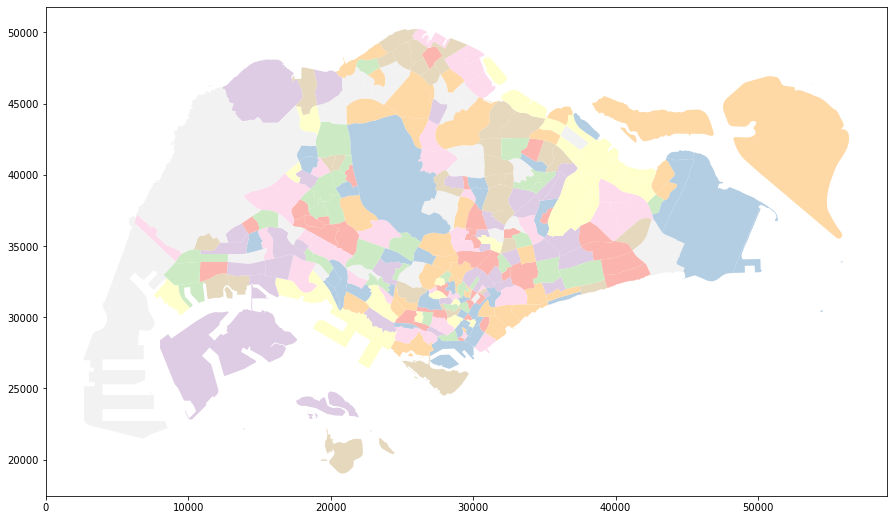

In [125]:
sz.plot("SUBZONE_N", cmap='Pastel1',figsize=(25,9))

#### Visualize Two Layers (geopandas tables)

<AxesSubplot:>

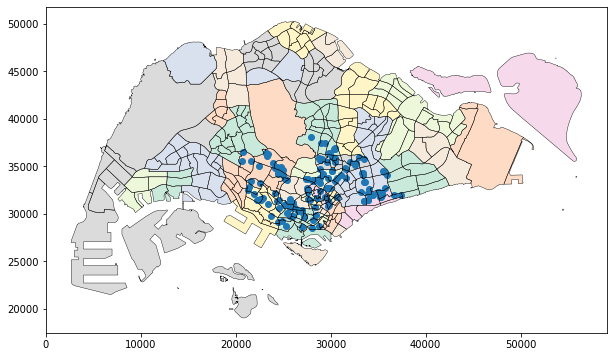

In [617]:
f, ax = plt.subplots(1,figsize=(12, 6))

sz.boundary.plot(ax=ax, figsize=(25, 14), color='Black', linewidth=.4)
sz.plot('PLN_AREA_N',ax=ax, cmap='Pastel2',alpha=0.7)
central_schools_sf.plot(ax=ax)

#### Visualize Map with Folium

In [626]:
!pip show folium

Name: folium
Version: 0.12.1.post1
Summary: Make beautiful maps with Leaflet.js & Python
Home-page: https://github.com/python-visualization/folium
Author: Rob Story
Author-email: wrobstory@gmail.com
License: MIT
Location: c:\users\user\appdata\roaming\python\python39\site-packages
Requires: branca, jinja2, numpy, requests
Required-by: 


In [637]:
?folium.Choropleth

Init signature:
folium.Choropleth(
    geo_data,
    data=None,
    columns=None,
    key_on=None,
    bins=6,
    fill_color=None,
    nan_fill_color='black',
    fill_opacity=0.6,
    nan_fill_opacity=None,
    line_color='black',
    line_weight=1,
    line_opacity=1,
    name=None,
    legend_name='',
    overlay=True,
    control=True,
    show=True,
    topojson=None,
    smooth_factor=None,
    highlight=None,
    **kwargs,
)
Docstring:     
Apply a GeoJSON overlay to the map.

Plot a GeoJSON overlay on the base map. There is no requirement
to bind data (passing just a GeoJSON plots a single-color overlay),
but there is a data binding option to map your columnar data to
different feature objects with a color scale.

If data is passed as a Pandas DataFrame, the "columns" and "key-on"
keywords must be included, the first to indicate which DataFrame
columns to use, the second to indicate the layer in the GeoJSON
on which to key the data. The 'columns' keyword does not need to be
pa

In [744]:
import folium

m = folium.Map(location=[1.3603, 103.808375],
           zoom_start=12,
           maxZoom=18,
           minZoom=11,
           tiles='https://maps-{s}.onemap.sg/v3/Default/{z}/{x}/{y}.png',
           attr= '<img src="https://docs.onemap.gov.sg/maps/images/oneMap64-01.png" style="height:20px;width:20px;"/> OneMap | Map data &copy; contributors, <a href="http://SLA.gov.sg">Singapore Land Authority</a>')

In [745]:
sz_joined_4326 = sz_joined.to_crs("epsg:4326")

In [746]:
sz_joined_4326.columns

Index(['SUBZONE_N', 'SUBZONE_C', 'PLN_AREA_N', 'PLN_AREA_C', 'REGION_N',
       'REGION_C', 'BET0TO2', 'BET3TO4', 'BET5TO6', 'BET7TO9',
       ...
       'Q', 'R', 'S', 'VariableX', 'Ina_CPF_N', 'geometry', 'Age_0to6',
       'has_pri_sch_stu', 'centroid', 'school_number'],
      dtype='object', length=110)

In [747]:
geo = gpd.GeoSeries(sz_joined_4326.set_index('SUBZONE_N')['geometry']).to_json()

In [749]:
folium.Choropleth(
    geo_data = geo,
    name = 'Choropleth',
    data = sz_joined_4326,
    columns = ['SUBZONE_N','school_number'],
    fill_color = 'YlGnBu',
    key_on="feature.id",
    fill_opacity = 0.5,
    line_opacity = 0.8,
    legend_name = 'school_number',
    smooth_factor=  0
).add_to(m)

Add points layer

In [730]:
m

In [761]:
# this line is important for later iteration
central_schools_sf = central_schools_sf.reset_index()
central_schools_sf

,level_0,index,BUILDING_N,latitude,longitude,HOUSE_BLK_NO,ROAD_NAME,POSTAL_CODE,address,geometry
0,0,0,ACS OLDHAM HALL - THE BOARDING SCHOOL,1.319923,103.834958,80,BARKER ROAD,309937.0,,POINT (28182.451 33575.896)
1,1,1,AI TONG SCHOOL,1.360583,103.833020,100,BRIGHT HILL DRIVE,579646.0,100 BRIGHT HILL DRIVE AI TONG SCHOOL SINGAPORE...,POINT (27966.772 38071.871)
2,2,2,ALEXANDRA PRIMARY SCHOOL,1.291334,103.824425,2A,PRINCE CHARLES CRESCENT,159016.0,2A PRINCE CHARLES CRESCENT ALEXANDRA PRIMARY S...,POINT (27010.221 30414.674)
3,3,3,ANGLO-CHINESE SCHOOL (BARKER ROAD),1.319662,103.835941,60,BARKER ROAD,309919.0,60 BARKER ROAD ANGLO-CHINESE SCHOOL (BARKER RO...,POINT (28291.850 33547.036)
4,4,4,ANGLO-CHINESE SCHOOL (INDEPENDENT) BOARDING SC...,1.301061,103.781310,119,DOVER ROAD,139656.0,,POINT (22211.913 31490.293)
...,...,...,...,...,...,...,...,...,...,...
138,138,146,SAINT CLARE SCHOOL,1.273598,103.833362,102B,UPPER ALJUNIED ROAD,367881.0,10 RAEBURN PARK SAINT CLARE SCHOOL FOR SPECIAL...,POINT (28004.784 28453.514)
139,139,150,CANOSSIAN SCHOOL,1.326859,103.881051,1,SALLIM ROAD,387621.0,1 SALLIM ROAD CANOSSIAN SCHOOL SINGAPORE 387621,POINT (33312.124 34342.872)
140,140,151,TANJONG KATONG GIRLS' SCHOOL,1.308213,103.895820,20,DUNMAN LANE,439272.0,20 DUNMAN LANE TANJONG KATONG GIRLS' SCHOOL SI...,POINT (34955.837 32281.123)
141,141,152,MARIS STELLA HIGH SCHOOL,1.341395,103.877852,80,BARTLEY ROAD,539786.0,25 MOUNT VERNON ROAD MARIS STELLA HIGH SCHOOL ...,POINT (32956.143 35950.176)


In [763]:
locations = central_schools_sf[['latitude', 'longitude']]
locationlist = locations.values.tolist()
len(locationlist)

143

In [764]:
for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point], popup=central_schools_sf['BUILDING_N'][point]).add_to(m)

In [765]:
folium.LayerControl().add_to(m)

In [767]:
m

In [772]:
# run this cell
import folium.plugins
m = folium.Map(location=[1.3603, 103.808375],
           zoom_start=12,
           maxZoom=18,
           minZoom=11,
           tiles='https://maps-{s}.onemap.sg/v3/Default/{z}/{x}/{y}.png',
           attr= '<img src="https://docs.onemap.gov.sg/maps/images/oneMap64-01.png" style="height:20px;width:20px;"/> OneMap | Map data &copy; contributors, <a href="http://SLA.gov.sg">Singapore Land Authority</a>')

folium.Choropleth(
    geo_data = geo,
    name = 'Choropleth',
    data = sz_joined_4326,
    columns = ['SUBZONE_N','school_number'],
    fill_color = 'YlGnBu',
    key_on="feature.id",
    fill_opacity = 0.5,
    line_opacity = 0.8,
    legend_name = 'school_number',
    smooth_factor=  0
).add_to(m)

marker_cluster = folium.plugins.MarkerCluster(control=False)
m.add_child(marker_cluster)

for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point], popup=central_schools_sf['BUILDING_N'][point], icon=folium.Icon(color='darkblue', icon_color='white', icon='male', angle=0, prefix='fa')).add_to(marker_cluster)

folium.LayerControl().add_to(m)
m

### Exercise Geopandas Visualization

1. Use Folium to add onemap basemap
2. Draw a choropleth map of the central region Social Economical subzone data (sz_joined_4326['REGION_N']=='CENTRAL REGION'). 
3. Add a point layer to the map using MarkerCluster. MRT data: (Data/MRT_CentralRegion_points.shp)

    hint: read shapefile:
    
    mrt = gpd.read_file('Data/MRT_CentralRegion_points.shp')

In [ ]:
###############################################
### add your codes here



###############################################

## NumPy (optional)

NumPy (Numerical Python) is a C implementation of arrays in Python. It provides an efficient interface to store and operate on dense data buffers. NumPy arrays provide much more efficient storage and data operations than Python list as the arrays grow larger in size. 

The CPython implementation is written in C. When we define an integer in Python, such as x = 100, x is actually a pointer to a compound C structure, which contains several values. 
A single integer in Python contains four pieces:

- ``ob_refcnt``, a reference count that helps Python silently handle memory allocation and deallocation
- ``ob_type``, which encodes the type of the variable
- ``ob_size``, which specifies the size of the following data members
- ``ob_digit``, which contains the actual integer value that we expect the Python variable to represent.

There is some overhead in storing an integer in Python as compared to C, as illustrated in the following figure:

### Understand Python Data Types 

![Integer Memory Layout](Resources/Figures/cint_vs_pyint.png)

An integer in C is a label for a position in memory whose bytes encode an integer value. A Python integer is a pointer to a position in memory containing all the Python object information, including the bytes (ob_digit) that contain the integer value. Everything in Python is an object. This structure allows Python to be coded so freely and dynamically. Let's look at Python list. Python's list can contain different data types (heterogeneous lists) due to dynamic typing.

In [17]:
L3 = [True, "2", 3.0, 4]
[type(item) for item in L3]

[bool, str, float, int]

The cost of this flexibility is that each item in the list must contain its own type info, even if all items are the same type. In this case, much of the information is redundant, and it can be much more efficient to store data in a fixed-type array (NumPy-style).

![Integer Memory Layout](Resources/Figures/array_vs_list.png)

### Understand Basic Numpy Vectorization 

Sometimes when all itmes in a list are numbers, we want to add a number to the list. For example:

In [10]:
list1= [1, 2, 3, 4]
list1

[1, 2, 3, 4]

In [12]:
# error 
# list1 + 10

In [54]:
[i +10 for i in list1]

[11, 12, 13, 14]

In [55]:
list2= [10, 20, 30, 40]
list2

[10, 20, 30, 40]

In [56]:
# list1+list2

[1, 2, 3, 4, 10, 20, 30, 40]

Although Python's array object provides array-based data as well, the ndarray object of the NumPy package is much more useful, as NumPy adds efficient operations on that data using vectorization.

In [13]:
a = np.array([10, 20, 90, 50])
b = 50
# the next line cause value error
# foo(a,b)

In [58]:
a

array([10, 20, 90, 50])

In [14]:
a+b

array([ 60,  70, 140, 100])

In [30]:
def foo(a, b):
    if a >= b:
        return a + b
    else:
        return a - b

In [31]:
# Create a vectorized version of foo
vecfoo = np.vectorize(foo)
vecfoo(a,b)

array([-40, -30, 140, 100])

In [32]:
c=[10,20]
d=1
results=[]
for i in c:
    results.append(d+i)
results

[11, 21]

In [33]:
[i+b if i>b else i-b for i in a]

[-40, -30, 140, 0]

### Create Numpy Arrays from scratch

What is b is also an array? How to add a and b? This is related to the next topic of broadcasting. Let's first look at how to create arrays from scratch using methods built into NumPy.

In [33]:
a = np.array([10, 20, 90, 100])
b = np.array([50,60])
# a+b

In [12]:
# Create a length-10 integer array filled with zeros
np.zeros(10, dtype=int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [38]:
np.zeros(10, dtype='int16')

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int16)

| Data type	    | Description |
|---------------|-------------|
| ``bool_``     | Boolean (True or False) stored as a byte |
| ``int_``      | Default integer type (same as C ``long``; normally either ``int64`` or ``int32``)| 
| ``intc``      | Identical to C ``int`` (normally ``int32`` or ``int64``)| 
| ``intp``      | Integer used for indexing (same as C ``ssize_t``; normally either ``int32`` or ``int64``)| 
| ``int8``      | Byte (-128 to 127)| 
| ``int16``     | Integer (-32768 to 32767)|
| ``int32``     | Integer (-2147483648 to 2147483647)|
| ``int64``     | Integer (-9223372036854775808 to 9223372036854775807)| 
| ``uint8``     | Unsigned integer (0 to 255)| 
| ``uint16``    | Unsigned integer (0 to 65535)| 
| ``uint32``    | Unsigned integer (0 to 4294967295)| 
| ``uint64``    | Unsigned integer (0 to 18446744073709551615)| 
| ``float_``    | Shorthand for ``float64``.| 
| ``float16``   | Half precision float: sign bit, 5 bits exponent, 10 bits mantissa| 
| ``float32``   | Single precision float: sign bit, 8 bits exponent, 23 bits mantissa| 
| ``float64``   | Double precision float: sign bit, 11 bits exponent, 52 bits mantissa| 
| ``complex_``  | Shorthand for ``complex128``.| 
| ``complex64`` | Complex number, represented by two 32-bit floats| 
| ``complex128``| Complex number, represented by two 64-bit floats| 

In [13]:
# Create a 3x5 floating-point array filled with ones
np.ones((3, 5), dtype=float)

array([[1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.]])

In [14]:
# Create a 3x5 array filled with 3.14
np.full((3, 5), 3.14)

array([[3.14, 3.14, 3.14, 3.14, 3.14],
       [3.14, 3.14, 3.14, 3.14, 3.14],
       [3.14, 3.14, 3.14, 3.14, 3.14]])

In [15]:
# Create a 3x3 identity matrix
np.eye(3)

array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.]])

In [16]:
# Create an uninitialized array of three integers
# The values will be whatever happens to already exist at that memory location
np.empty(3)

array([1., 1., 1.])

In [17]:
# Create an array filled with a linear sequence
# Starting at 0, ending at 20, stepping by 2
# (this is similar to the built-in range() function)
np.arange(0, 20, 5)

array([ 0,  5, 10, 15])

In [18]:
# Create an array of five values evenly spaced between 0 and 1
np.linspace(0, 1, 5)

array([0.  , 0.25, 0.5 , 0.75, 1.  ])

In [17]:
# create an 2D array
a = np.array([[1,2],[3,4],[5,6]])
print(a.shape)
print(a.ndim)
print(a.size)
a

(3, 2)
2
6


array([[1, 2],
       [3, 4],
       [5, 6]])

### Create Random Numbers 

In [18]:
# Create a 3x3 array of uniformly distributed
# random values between 0 and 1
np.random.random((3, 3))

array([[0.11247023, 0.65051421, 0.67304464],
       [0.06124657, 0.82783675, 0.75819136],
       [0.75099477, 0.08241334, 0.01992314]])

In [19]:
# Create a 3x3 array of normally distributed random values
# with mean 0 and standard deviation 1
np.random.normal(0, 1, (3, 3))

array([[ 1.0065223 ,  0.62131562, -0.66460391],
       [-0.23240608, -0.62373929,  0.83321115],
       [ 0.37488207, -2.3708618 , -0.04062557]])

In [47]:
# normal distribution
x = np.random.normal(loc=1, scale=2, size=(2, 3))
print(x)

[[-1.97949149  0.07088962 -0.55938813]
 [ 1.22186105  4.23425055 -0.62086966]]


In [23]:
# normal distribution
x = np.random.normal(loc=0, scale=1, size=100)
print(x)

[ 0.18013864  0.31767639  0.79552213 -0.8956762   1.396535    0.62094505
  0.5815765   0.42013544  0.39837215  1.23710495 -1.57501405 -0.06853587
  0.1501547   2.46841685  0.69846531  0.65951565  0.40887198 -0.22271716
  0.67785172 -2.4428837   0.48367925 -0.5808177   0.05203204 -0.61256284
  1.05579481 -1.00277211 -0.26087608 -1.13032707 -0.16051005 -0.867787
  0.58610644 -1.38524043 -0.10803133  0.73952902  0.28374222 -0.83595801
  0.34669504  0.03052192 -0.03953741  1.34460293  0.70842179 -0.64741807
  0.03617702  0.16639046  0.41058306  1.9506743  -1.71190228 -1.06015052
 -0.81262477 -1.43993637 -0.0075596  -0.15658087  0.48395187 -2.10910932
  0.65512985  0.22798652  1.0943754   0.9479466  -0.36218227 -1.17970125
  0.81628994  0.40795926 -0.20678504 -0.5568741  -0.30568307  0.54457999
  0.25317738  1.12039671 -0.51781216  0.36623733 -0.05336758 -0.5062004
 -1.3075819  -0.74067489  1.16126747 -0.08894604 -0.9898536  -0.25325264
 -0.00861538  0.93517576 -0.38402716 -0.07250763  0.25

In [29]:
x2 = np.random.normal(loc=0, scale=5, size=100)
print(x2)

[-8.93533311e-01 -7.13524883e-01 -3.06112795e+00  6.20959267e+00
  2.16928333e+00  9.09661653e+00  4.66695471e+00  2.57761593e+00
 -6.01090370e-01 -3.27222563e+00  3.48066058e-01 -7.73745987e+00
 -4.24362228e+00  4.16127824e+00 -1.54578175e+00 -1.83349724e-01
 -1.55504516e+00 -4.15568412e+00 -8.99597387e-01 -6.26659658e+00
  3.56915785e+00 -2.90971126e+00 -9.53543037e+00 -9.73787185e+00
  7.69915476e-01 -6.49652751e+00 -8.28315569e-01 -3.71642976e+00
  3.67065282e+00 -2.92491561e+00 -3.96970996e-01 -1.94522852e+00
  6.74335911e-02 -4.13130141e+00  4.57862163e+00  1.24557755e+01
 -1.87583516e+00 -5.86407649e+00  1.07413833e-01 -6.55458408e+00
 -8.37907092e+00 -3.10857609e+00 -4.95754322e+00 -1.60068740e+00
 -1.81954677e+00  8.10875616e-01 -6.60562091e+00  5.45720924e+00
  5.18501541e+00 -3.50050189e-01 -1.22970187e+01 -2.30655031e+00
 -3.46908733e+00  2.80017906e-01 -8.40266233e+00 -2.16688121e+00
 -2.00862637e+00  2.12853535e-03  1.74150881e+00  3.25470705e+00
 -2.26831927e+00 -6.72229

### Visualize the numbersrange(0,100)range(0,100)

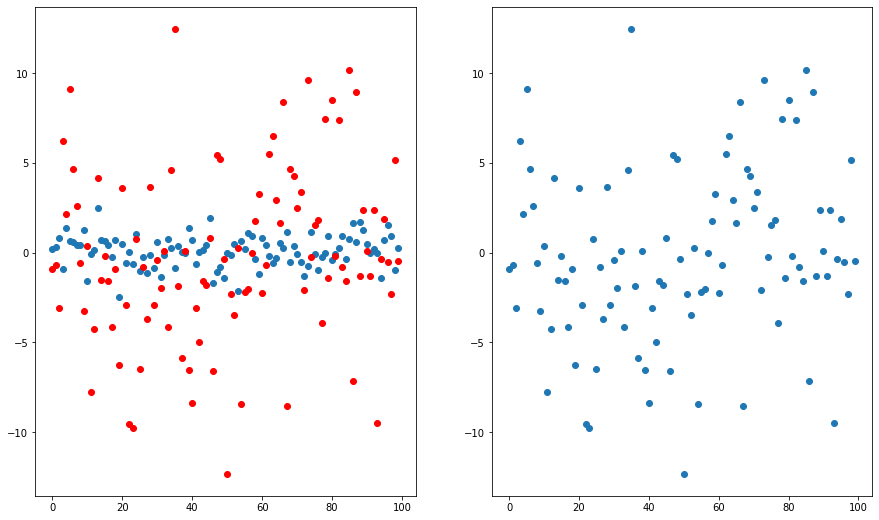

In [35]:
import matplotlib.pyplot as plt
fg, (ax1,ax2) = plt.subplots(1,2,figsize=(15,9))
ax1.scatter(range(0,100), x)
ax1.scatter(range(0,100), x2,c="r")
ax2.scatter(range(0,100), x2)

In [42]:
# Create a 3x3 array of random integers in the interval [0, 10)
np.random.randint(0, 10, (3, 3))

array([[9, 5, 5],
       [9, 6, 4],
       [1, 0, 1]])

In [21]:
x = np.random.choice([3, 5, 7, 9])
print(x)

9


In [45]:
x = np.random.choice([3, 5, 7, 9], size=(3, 5))
print(x)

[[7 5 7 7 5]
 [9 5 7 7 9]
 [5 3 5 5 7]]


In [46]:
# data distribution
x = np.random.choice([3, 5, 7, 9], p=[0.1, 0.3, 0.6, 0.0], size=(100))
print(x)

[7 3 7 7 7 7 3 7 5 7 3 7 7 7 7 7 7 7 7 7 5 3 7 7 7 7 7 7 7 7 5 3 7 7 5 7 7
 7 3 5 3 3 7 7 3 5 7 3 3 7 7 7 7 7 7 7 7 7 3 7 3 5 5 7 7 7 7 7 7 5 7 7 7 7
 7 5 7 5 5 7 7 7 7 7 5 5 3 7 7 7 7 7 7 7 5 7 5 7 7 7]


In [48]:
# binomial distribution
x = np.random.binomial(n=10, p=0.5, size=10)
print(x)

[7 5 3 7 6 4 5 4 4 4]


In [49]:
x = np.random.poisson(lam=2, size=10)
print(x)

[0 2 1 3 1 3 3 1 2 2]


In [50]:
x = np.random.uniform(size=(2, 3))

In [51]:
x = np.random.logistic(loc=1, scale=2, size=(2, 3))

In [52]:
x = np.random.multinomial(n=6, pvals=[1/6, 1/6, 1/6, 1/6, 1/6, 1/6])

In [53]:
x = np.random.exponential(scale=2, size=(2, 3))

In [54]:
x = np.random.chisquare(df=2, size=(2, 3))

### Array Indexing 

In [19]:
x = np.array([[1.1,1.2,1.3,1.4],[2.1,2.2,2.3,2.4],[3.1,3.2,3.3,3.4],[4.1,4.2,4.3,4.4]])
x

array([[1.1, 1.2, 1.3, 1.4],
       [2.1, 2.2, 2.3, 2.4],
       [3.1, 3.2, 3.3, 3.4],
       [4.1, 4.2, 4.3, 4.4]])

In [20]:
x[1,2]

2.3

In [61]:
x[-2,-1]

3.4

### Array Slicing

Just as we can use square brackets to access individual Python array elements, we can also use them to access Numpy subarrays with the slice notation, marked by the colon (:) character.
```
x[start:stop:step]
```
If any of these are unspecified, they default to the values start=0, stop=size of dimension, step=1. We'll take a look at accessing sub-arrays in one dimension and in multiple dimensions.

In [62]:
x[:3]  # first three rows

array([[1.1, 1.2, 1.3, 1.4],
       [2.1, 2.2, 2.3, 2.4],
       [3.1, 3.2, 3.3, 3.4]])

In [22]:
x[:3,2:] # row 1 to 3, column 3 to 4 

array([[1.3, 1.4],
       [2.3, 2.4],
       [3.3, 3.4]])

In [69]:
x[:-1,1]

array([1.2, 2.2, 3.2])

In [70]:
x[::-1] #reverse row

array([[4.1, 4.2, 4.3, 4.4],
       [3.1, 3.2, 3.3, 3.4],
       [2.1, 2.2, 2.3, 2.4],
       [1.1, 1.2, 1.3, 1.4]])

In [64]:
x[::2]

array([[1.1, 1.2, 1.3, 1.4],
       [3.1, 3.2, 3.3, 3.4]])

In [67]:
x[::-2]

array([[4.1, 4.2, 4.3, 4.4],
       [2.1, 2.2, 2.3, 2.4]])

In [88]:
x=np.array([9, 8, 7, 6, 5, 4, 3, 2, 1, 0])

In [91]:
x[3::2]

array([6, 4, 2, 0])

In [92]:
x[3::-2]

array([6, 8])

Note: if step is nagative, start should be larger than stop.

In [98]:
x[1:8:2]

array([8, 6, 4, 2])

In [99]:
x[8:1:-2]

array([1, 3, 5, 7])

### Accessing array rows and columns 

In [100]:
x=np.random.normal(0, 10, (4, 4))
x

array([[  8.34601073,  11.15262237,  11.01328401,  -7.42832058],
       [-30.30107503, -16.8928445 ,  14.64111392, -11.54815956],
       [ -8.06878909,   3.52226986,  13.60124825,  -7.78128454],
       [ 11.78343973,   4.96366682, -23.03305137, -11.82068973]])

In [102]:
x[0] # first row, equals x[0,:]

array([ 8.34601073, 11.15262237, 11.01328401, -7.42832058])

In [104]:
x[:,0] # first column

array([  8.34601073, -30.30107503,  -8.06878909,  11.78343973])

### Subarrays as no-copy views 

One **important–thing** to know about array slices is that they return views rather than copies of the array data (in Python lists, slices will be copies). 

In [107]:
subarray = x[:,0]
subarray

array([  8.34601073, -30.30107503,  -8.06878909,  11.78343973])

In [109]:
subarray[1] = 100
subarray

array([  8.34601073, 100.        ,  -8.06878909,  11.78343973])

In [110]:
x

array([[  8.34601073,  11.15262237,  11.01328401,  -7.42832058],
       [100.        , -16.8928445 ,  14.64111392, -11.54815956],
       [ -8.06878909,   3.52226986,  13.60124825,  -7.78128454],
       [ 11.78343973,   4.96366682, -23.03305137, -11.82068973]])

We can copy the sub array using the copy method.

In [111]:
subarray = x[:,0].copy()
subarray[1] = 1000
x

array([[  8.34601073,  11.15262237,  11.01328401,  -7.42832058],
       [100.        , -16.8928445 ,  14.64111392, -11.54815956],
       [ -8.06878909,   3.52226986,  13.60124825,  -7.78128454],
       [ 11.78343973,   4.96366682, -23.03305137, -11.82068973]])

Change a one-dimensional array into a two-dimensional row or column matrix with the reshape method. The size of the initial array must match the size of the reshaped array. Where possible, the reshape method will use a no-copy view of the initial array,

In [116]:
x =np.arange(1, 10)
x

array([1, 2, 3, 4, 5, 6, 7, 8, 9])

In [119]:
y=x.reshape((3, 3))
y

array([[1, 2, 3],
       [4, 5, 6],
       [7, 8, 9]])

In [121]:
y[1,1] =100
y

array([[  1,   2,   3],
       [  4, 100,   6],
       [  7,   8,   9]])

In [122]:
x

array([  1,   2,   3,   4, 100,   6,   7,   8,   9])

In [126]:
y

array([[  1,   2,   3],
       [  4, 100,   6],
       [  7,   8,   9]])

In [127]:
x[:,np.newaxis]

array([[  1],
       [  2],
       [  3],
       [  4],
       [100],
       [  6],
       [  7],
       [  8],
       [  9]])

In [129]:
x[np.newaxis,:] # note that this is a matrix with 1 row and 9 columns. 

array([[  1,   2,   3,   4, 100,   6,   7,   8,   9]])

### Array Concatenation and Splitting

np.concatenate takes a tuple or list of arrays as its first argument.

In [78]:
# combining array
arr1 = np.array([1, 2, 3])
arr2 = np.array([4, 5, 6])
arr = np.concatenate((arr1, arr2))
arr

array([1, 2, 3, 4, 5, 6])

In [79]:
arr1 = np.array([[1, 2], [3, 4]])
arr2 = np.array([[5, 6], [7, 8]])

In [80]:
arr = np.concatenate((arr1, arr2), axis=0)
arr

array([[1, 2],
       [3, 4],
       [5, 6],
       [7, 8]])

In [134]:
arr_axis1 = np.concatenate((arr1, arr2), axis=1)
arr_axis1

array([[1, 2, 5, 6],
       [3, 4, 7, 8]])

For working with arrays of mixed dimensions, it can be clearer to use the np.vstack (vertical stack) and np.hstack (horizontal stack) functions:

In [136]:
arr1 = np.array([1, 2, 3])
arr2 = np.array([4, 5, 6])
arr_h = np.hstack((arr1, arr2))
arr_h

array([1, 2, 3, 4, 5, 6])

In [138]:
arr_v = np.vstack((arr1, arr2))
arr_v 

array([[1, 2, 3],
       [4, 5, 6]])

In [147]:
arr_v.shape

(2, 3)

Similary, np.dstack will stack arrays along the third axis.

In [142]:
arr1

array([1, 2, 3])

In [143]:
arr2

array([4, 5, 6])

In [146]:
arr_d = np.dstack((arr1, arr2))
arr_d 

array([[[1, 4],
        [2, 5],
        [3, 6]]])

In [145]:
arr_d.shape

(1, 3, 2)

### Splitting of Arrays

The opposite of concatenation is splitting, which is implemented by the functions np.split, np.hsplit, and np.vsplit. For each of these, we can pass a list of indices giving the split points.

array_split allows indices_or_sections to be an integer that does not equally divide the axis. For an array of length l that should be split into n sections, it returns l % n sub-arrays of size l//n + 1 and the rest of size l//n.

In [22]:
# split array
arr = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9], [10, 11, 12], [13, 14, 15], [16, 17, 18]])
newarr1,newarr2 = np.array_split(arr, 2, axis=1)
newarr1,newarr2

(array([[ 1,  2],
        [ 4,  5],
        [ 7,  8],
        [10, 11],
        [13, 14],
        [16, 17]]),
 array([[ 3],
        [ 6],
        [ 9],
        [12],
        [15],
        [18]]))

In [23]:
x1, x2, x3 = np.split(arr, [3, 5])
x1, x2, x3 

(array([[1, 2, 3],
        [4, 5, 6],
        [7, 8, 9]]),
 array([[10, 11, 12],
        [13, 14, 15]]),
 array([[16, 17, 18]]))

In [162]:
haha = np.array_split(arr, 4) #array_split does not require equal size
haha

[array([[1, 2, 3],
        [4, 5, 6]]),
 array([[ 7,  8,  9],
        [10, 11, 12]]),
 array([[13, 14, 15]]),
 array([[16, 17, 18]])]

In [ ]:
# search
arr = np.array([1, 2, 3, 4, 5, 4, 4])
x = np.where(arr == 4)
x

### NumPy Arrays Universal Functions

The following table provides a list of useful aggregation functions available in NumPy:

|Function Name      |   NaN-safe Version  | Description                                   |
|-------------------|---------------------|-----------------------------------------------|
| ``np.sum``        | ``np.nansum``       | Compute sum of elements                       |
| ``np.prod``       | ``np.nanprod``      | Compute product of elements                   |
| ``np.mean``       | ``np.nanmean``      | Compute mean of elements                      |
| ``np.std``        | ``np.nanstd``       | Compute standard deviation                    |
| ``np.var``        | ``np.nanvar``       | Compute variance                              |
| ``np.min``        | ``np.nanmin``       | Find minimum value                            |
| ``np.max``        | ``np.nanmax``       | Find maximum value                            |
| ``np.argmin``     | ``np.nanargmin``    | Find index of minimum value                   |
| ``np.argmax``     | ``np.nanargmax``    | Find index of maximum value                   |
| ``np.median``     | ``np.nanmedian``    | Compute median of elements                    |
| ``np.percentile`` | ``np.nanpercentile``| Compute rank-based statistics of elements     |
| ``np.any``        | N/A                 | Evaluate whether any elements are true        |
| ``np.all``        | N/A                 | Evaluate whether all elements are true        |

The bottleneck here is the type-checking and function dispatches that CPython must do at each cycle of the loop. Each time the reciprocal is computed, Python first examines the object's type and does a dynamic lookup of the correct function to use for that type. 

In [24]:
big_array = np.random.randint(1, 100, size=1000000)

In [25]:
%timeit sum(big_array)
%timeit np.sum(big_array)

69.4 ms ± 10.7 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
346 µs ± 2.19 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [172]:
x = np.arange(9).reshape((3, 3))
2 ** x

array([[  1,   2,   4],
       [  8,  16,  32],
       [ 64, 128, 256]], dtype=int32)

In [175]:
x = np.arange(4)
print("x     =", x)
print("x + 5 =", x + 5)
print("x - 5 =", x - 5)
print("x * 2 =", x * 2)
print("x / 2 =", x / 2)
print("x // 2 =", x // 2)  # floor division
print("-x     = ", -x)
print("x ** 2 = ", x ** 3)
print("x % 2  = ", x % 3)

x     = [0 1 2 3]
x + 5 = [5 6 7 8]
x - 5 = [-5 -4 -3 -2]
x * 2 = [0 2 4 6]
x / 2 = [0.  0.5 1.  1.5]
x // 2 = [0 0 1 1]
-x     =  [ 0 -1 -2 -3]
x ** 2 =  [ 0  1  8 27]
x % 2  =  [0 1 2 0]


* Numpy's limitations become clear when we need more flexibility (e.g., attaching labels to data, working with missing data, etc.) and when attempting operations that do not map well to element-wise broadcasting such as groupings, pivots, etc. Pandas builds on the NumPy array structure and provides efficient access to these sorts of "data munging" tasks that occupy much of a data scientist's time.

### Exercise Numpy

1. Use Numpy to create a 5 * 5 matrix (we provided an example of example_arr)
2. Sum the matrix by rows
3. Select the 1st, 2nd, and 5th Column of the matrix
4. Create a 5 * 3 numpy matrix
5. Concatecate the two matrix along columns
6. Calculate the mean of each column

Hint: 
``` 
x = np.arange(9).reshape((3, 3)) # create a 3 * 3 matrix: 
x.sum(axis=0) # calculate sum along rows
```

In [59]:
r1 = np.linspace(1.1,1.5,5)
arr = [r1 + i for i in range(0,5)]
example_arr = np.array(arr)
example_arr

array([[1.1, 1.2, 1.3, 1.4, 1.5],
       [2.1, 2.2, 2.3, 2.4, 2.5],
       [3.1, 3.2, 3.3, 3.4, 3.5],
       [4.1, 4.2, 4.3, 4.4, 4.5],
       [5.1, 5.2, 5.3, 5.4, 5.5]])